In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.spatial.distance import hamming
import folium
from haversine import haversine
from datetime import datetime
import networkx as nx
from itertools import combinations
from geopy.distance import geodesic
from sklearn.preprocessing import LabelEncoder

In [4]:
# Junção dos vários ficheiros xlsx em 3 dataframes diferentes
path = os.path.join(os.getcwd() + "\\POC\\")
files = os.listdir(path)
files_xls = [f for f in files if f.endswith(".xlsx")]
df_dados_rota = pd.concat([pd.read_excel(path + file, sheet_name='Dados Rota', na_values = '') for file in files_xls], ignore_index=True)
df_composicao_remessa = pd.concat([pd.read_excel(path + file, sheet_name='Composição da remessa', na_values = '') for file in files_xls], ignore_index=True)
#df_dimensoes_material = pd.concat([pd.read_excel(path + file, sheet_name='Dimensões Material') for file in files_xls], ignore_index=True)  


In [5]:
# Leitura do dataframe relativo a Composição da remessa
df_composicao_remessa

,Transporte,Fornecimento,Receb.merc,Material,Nº do material,Qtd.remessa,UM,Fornecimento.1,Peso líquido,Un.,Peso bruto,Un..1
0,769709,2019389293,21005938,12365,"Um Bongo 8 Frutos 8x3 TET 0,20L",4,TAB,2019389293,19.928,KG,21.208,KG
1,769709,2019389293,21005938,13159,"Compal Clás Néc T. Frutti 18 TET0,33L Nv",1,TAB,2019389293,6.159,KG,6.545,KG
2,769709,2019389293,21005938,13426,"Compal Orig Néc Lar Algarv 18TET0,33L",1,TAB,2019389293,6.201,KG,6.586,KG
3,769709,2019389294,21002745,13383,"Compal Clás Néc Pêssego 15 GR 0,20L Nv",1,TAB,2019389294,3.135,KG,5.287,KG
4,769709,2019389294,21002745,15516,"Água Serra Estrela 24 GR 0,50L PET",8,TAB,2019389294,96.000,KG,102.696,KG
...,...,...,...,...,...,...,...,...,...,...,...,...
17709,769398,2019387009,11068117,12365,"Um Bongo 8 Frutos 8x3 TET 0,20L",3,TAB,2019387009,14.946,KG,15.906,KG
17710,769395,2019387010,11060294,14089,"Compal Vital Eq Manga Laranja 15 GR 0,2L",2,TAB,2019387010,6.090,KG,10.394,KG
17711,769395,2019387010,11060294,15518,"Água Serra Estrela 12 GR 1,5L PET",8,TAB,2019387010,144.000,KG,146.904,KG
17712,769395,2019387010,11060294,10404,"Sumol Lar 6 GR 1,5L PET",1,TAB,2019387010,9.204,KG,9.537,KG


In [6]:
# Leitura do dataframe relativo a Dados Rota
df_dados_rota

,Data,Matrícula,Capacidade,Tipologia,Nome,Kg,Morada,Latitude,Longitude,Tipo de visita,Janela Horária,Horário,Visita,Distância,Referência Cliente,Transporte,Fornecimento,Sequência real,Horário real de entrega
0,01.04.2022,09-PZ-62,5500.0,Pesado,1090 - Coimbra,2988.92,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.244350,-8.443650,Partida,00:00-00:00+3,07:05,0.0,0.000,NaN,769710.0,NaN,NaN,NaN
1,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 1,160.13,"R. D. MANUEL BARBUDA E VASCONC,3810-498AVEIRO,...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,51.066,21012087.0,769710.0,2.019389e+09,2.0,09:39:28
2,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 2,135.47,"CC GLICINIAS PLAZA AVEIRO Loja,3810-419AVEIRO ...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,0.000,21006784.0,769710.0,2.019389e+09,1.0,09:13:02
3,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 3,241.19,"CC GLICINIAS PLAZA, LJ 2.09,3810-419AVEIRO, 38...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,0.000,11114246.0,769710.0,2.019389e+09,3.0,09:49:13
4,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 4,21.12,"R ESPINHO 47,3800-110AVEIRO, 3800-110 AVEIRO",40.629385,-8.650217,Entrega,08:00-19:00,09:00,6.0,0.746,11002692.0,769710.0,2.019389e+09,4.0,09:58:52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2697,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 5,324.42,"R CELESTINO NETO N 5,3750-126AGUEDA, 3750-126 ...",40.572285,-8.444697,Entrega,"08:00-11:30, 15:00-18:00",15:16,15.0,18.953,11049824.0,769400.0,2.019387e+09,9.0,16:53:58
2698,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 6,158.89,"R COMERCIO S/N,3780-124ANADIA - SANGALHOS, 378...",40.486230,-8.469551,Entrega,08:00-19:00,15:45,19.0,12.077,11087080.0,769400.0,2.019387e+09,10.0,17:28:57
2699,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 7,102.94,"R VL N 40,3780-599ANADIA - VILARINHO BAIRRO, 3...",40.421542,-8.521223,Entrega,08:00-19:00,16:19,16.0,10.581,11059984.0,769400.0,2.019387e+09,3.0,12:33:43
2700,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 8,127.00,"EST PRINCIPAL,3780-597ANADIA - VILARINHO BAIRR...",40.418155,-8.560282,Entrega,"08:00-11:30, 15:00-19:00",16:40,18.0,3.488,11049474.0,769400.0,2.019387e+09,1.0,12:10:31


In [7]:
# Informação sobre o tipo das variáveis e a existência ou não de nulls
df_dados_rota.info(show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2702 entries, 0 to 2701
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Data                     2587 non-null   object 
 1   Matrícula                2587 non-null   object 
 2   Capacidade               2587 non-null   float64
 3   Tipologia                2587 non-null   object 
 4   Nome                     2587 non-null   object 
 5   Kg                       2587 non-null   float64
 6   Morada                   2587 non-null   object 
 7   Latitude                 2587 non-null   float64
 8   Longitude                2587 non-null   float64
 9   Tipo de visita           2588 non-null   object 
 10  Janela Horária           2578 non-null   object 
 11  Horário                  2587 non-null   object 
 12  Visita                   2579 non-null   float64
 13  Distância                2587 non-null   float64
 14  Referência Cliente      

In [8]:
# Informação sobre o tipo das variáveis e a existência ou não de nulls
df_composicao_remessa.info(show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17714 entries, 0 to 17713
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Transporte      17714 non-null  int64  
 1   Fornecimento    17714 non-null  int64  
 2   Receb.merc      17714 non-null  int64  
 3   Material        17714 non-null  int64  
 4   Nº do material  17714 non-null  object 
 5   Qtd.remessa     17714 non-null  int64  
 6   UM              17714 non-null  object 
 7   Fornecimento.1  17714 non-null  int64  
 8   Peso líquido    17714 non-null  float64
 9   Un.             17714 non-null  object 
 10  Peso bruto      17714 non-null  float64
 11  Un..1           17714 non-null  object 
dtypes: float64(2), int64(6), object(4)
memory usage: 1.6+ MB


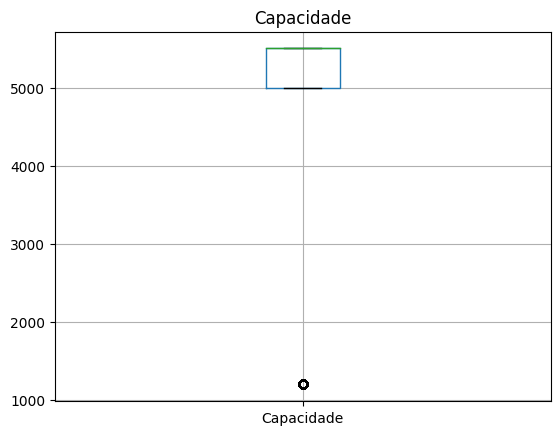

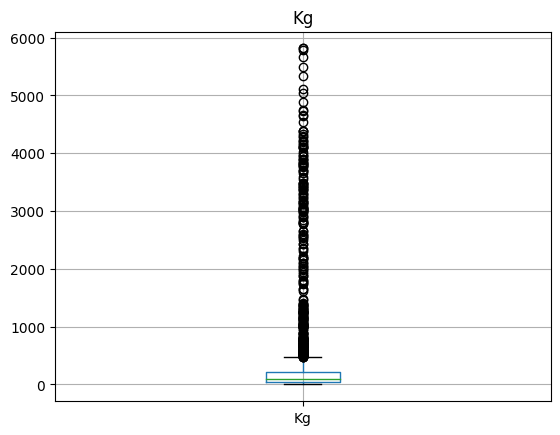

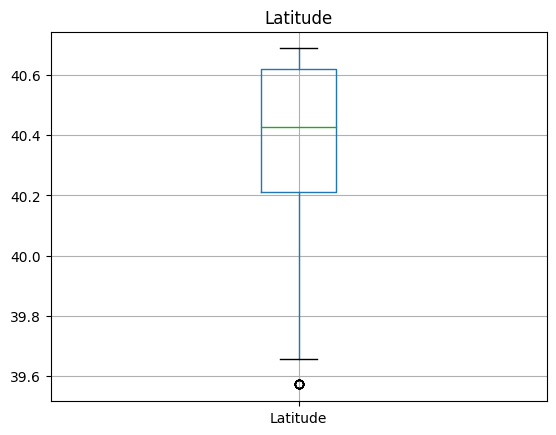

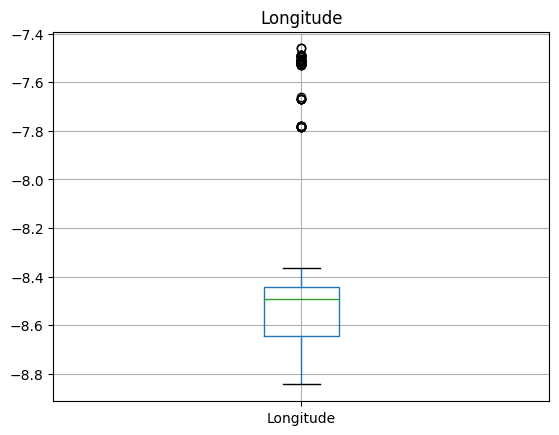

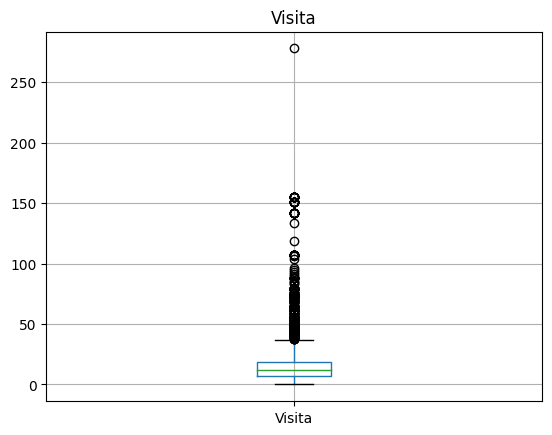

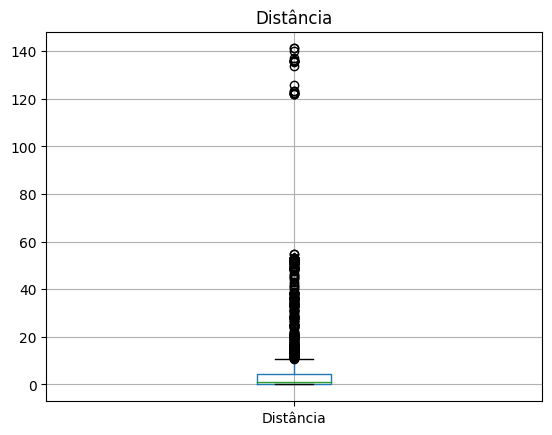

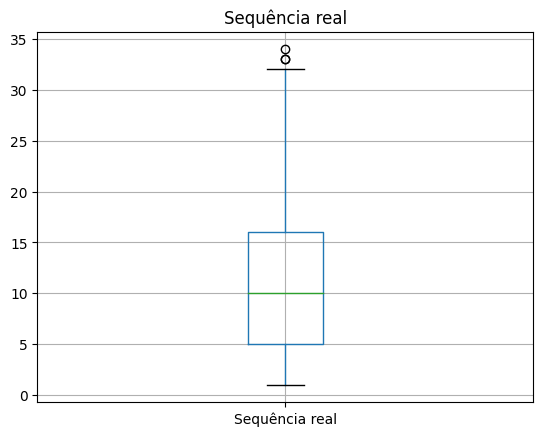

In [9]:
# Análise dos boxplots para as variáveis preditoras
aux = df_dados_rota.select_dtypes(include='float64')
aux = aux.drop(columns=['Fornecimento','Transporte','Referência Cliente'])
# Create a boxplot for each column
for col in aux.columns:
    df_dados_rota[[col]].boxplot()
    plt.title(col)
    plt.show()

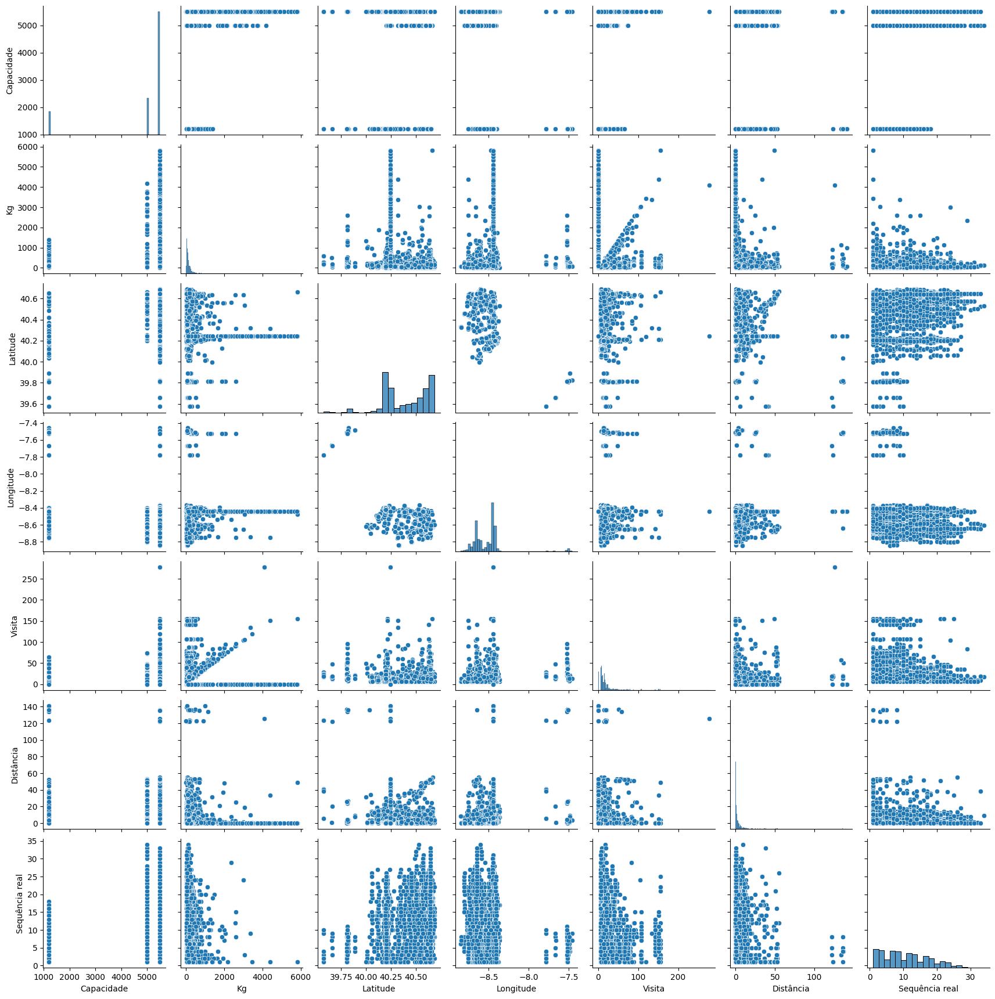

In [10]:
# Pairplot das variáveis numéricas
sns.pairplot(aux)
plt.show()

In [11]:
# Estatística descritiva das variáveis
df_dados_rota.describe().round(2)

,Capacidade,Kg,Latitude,Longitude,Visita,Distância,Referência Cliente,Transporte,Fornecimento,Sequência real
count,2587.00,2587.00,2587.00,2587.00,2579.00,2587.00,2315.00,2587.00,2.315000e+03,2315.00
mean,4851.57,327.12,40.40,-8.51,18.71,5.87,13217840.24,768755.91,2.019476e+09,10.87
std,1410.27,748.82,0.22,0.20,24.05,14.91,4068726.88,1490.35,1.112460e+06,6.97
min,1200.00,0.00,39.57,-8.84,0.00,0.00,11000454.00,766218.00,2.019356e+09,1.00
25%,5000.00,51.48,40.21,-8.65,7.00,0.26,11050831.50,767460.00,2.019368e+09,5.00
50%,5500.00,101.14,40.43,-8.49,12.00,1.25,11078635.00,768883.00,2.019382e+09,10.00
75%,5500.00,220.41,40.62,-8.44,19.00,4.49,11114477.00,769950.00,2.019394e+09,16.00
max,5500.00,5811.83,40.69,-7.46,278.00,141.14,21012319.00,771213.00,2.032411e+09,34.00


In [12]:
# Estatística descritiva das variáveis
df_composicao_remessa.describe().round(2)

,Transporte,Fornecimento,Receb.merc,Material,Qtd.remessa,Fornecimento.1,Peso líquido,Peso bruto
count,17714.00,1.771400e+04,17714.00,17714.00,17714.00,1.771400e+04,17714.00,17714.00
mean,768757.57,2.019486e+09,13270147.72,18982.06,2.61,2.019486e+09,18.10,22.50
std,1508.25,1.169890e+06,4082841.98,32005.97,5.74,1.169890e+06,55.04,61.37
min,766218.00,2.019356e+09,11000454.00,10136.00,1.00,2.019356e+09,0.00,0.00
25%,767460.00,2.019368e+09,11050980.00,12123.00,1.00,2.019368e+09,3.14,5.29
50%,768883.00,2.019382e+09,11078607.00,13540.50,1.00,2.019382e+09,7.91,9.91
75%,770185.00,2.019394e+09,11114802.00,17092.00,2.00,2.019394e+09,12.54,18.66
max,771213.00,2.032411e+09,21012319.00,299781.00,160.00,2.032411e+09,1656.00,1689.40


C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\3644785573.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_dados_rota.corr(method='spearman'), annot=True, fmt=".2f")


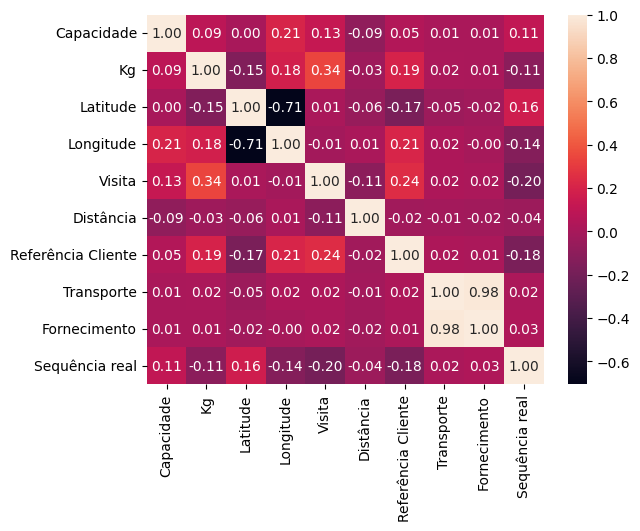

In [13]:
# Correlação entre as variáveis
sns.heatmap(df_dados_rota.corr(method='spearman'), annot=True, fmt=".2f")
plt.show()

C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\3984922672.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_composicao_remessa.corr(),annot=True, fmt=".2f")


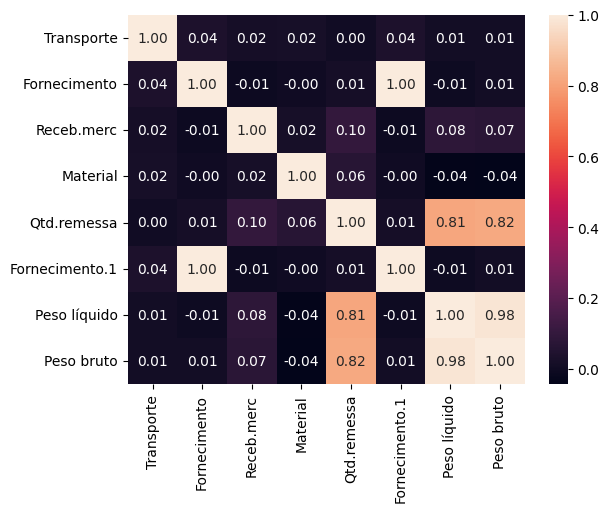

In [14]:
# Correlação entre as variáveis
sns.heatmap(df_composicao_remessa.corr(),annot=True, fmt=".2f")
plt.show()

In [15]:
# Correlação entre todas as variáveis e a variável alvo
df_dados_rota.corr()['Sequência real']

C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\2159662707.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_dados_rota.corr()['Sequência real']


Capacidade            0.220301
Kg                   -0.101676
Latitude              0.213043
Longitude            -0.177407
Visita               -0.185146
Distância            -0.116066
Referência Cliente   -0.165878
Transporte            0.028339
Fornecimento          0.020876
Sequência real        1.000000
Name: Sequência real, dtype: float64

In [16]:
# Vericação percentual da capacidade com kg e respetiva tipologia
capacidade = df_dados_rota[df_dados_rota['Tipo de visita']=="Partida"].copy()
capacidade["Percentagem"] = capacidade["Kg"] / capacidade["Capacidade"].astype(float) *100

# Configuração temporária para exibir todas as linhas
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(capacidade)

            Data   Matrícula  Capacidade Tipologia            Nome       Kg  \
0     01.04.2022    09-PZ-62      5500.0    Pesado  1090 - Coimbra  2988.92   
24    01.04.2022    43-TC-65      5000.0    Pesado  1090 - Coimbra  3468.78   
51    01.04.2022    39-10-RI      5500.0    Pesado  1090 - Coimbra  4016.36   
79    01.04.2022    39-00-RI      5500.0    Pesado  1090 - Coimbra  4544.75   
110   01.04.2022    38-99-RI      5500.0    Pesado  1090 - Coimbra  3060.34   
132   01.04.2022    AA-41-RS      1200.0   Ligeiro  1090 - Coimbra  1165.10   
140   01.04.2022  AA-41-RS/2      1200.0   Ligeiro  1090 - Coimbra  1002.25   
148   04.04.2022    AA-41-RS      1200.0   Ligeiro  1090 - Coimbra  1071.60   
160   04.04.2022    38-99-RI      5500.0    Pesado  1090 - Coimbra  5050.23   
170   04.04.2022    39-00-RI      5500.0    Pesado  1090 - Coimbra  3436.88   
174   04.04.2022    09-PZ-62      5500.0    Pesado  1090 - Coimbra  3904.22   
194   04.04.2022    43-TC-65      5000.0    Pesado  

In [17]:
capacidade

,Data,Matrícula,Capacidade,Tipologia,Nome,Kg,Morada,Latitude,Longitude,Tipo de visita,Janela Horária,Horário,Visita,Distância,Referência Cliente,Transporte,Fornecimento,Sequência real,Horário real de entrega,Percentagem
0,01.04.2022,09-PZ-62,5500.0,Pesado,1090 - Coimbra,2988.92,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,07:05,0.0,0.0,NaN,769710.0,NaN,NaN,NaN,54.344000
24,01.04.2022,43-TC-65,5000.0,Pesado,1090 - Coimbra,3468.78,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,07:14,0.0,0.0,NaN,769709.0,NaN,NaN,NaN,69.375600
51,01.04.2022,39-10-RI,5500.0,Pesado,1090 - Coimbra,4016.36,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,08:07,0.0,0.0,NaN,769713.0,NaN,NaN,NaN,73.024727
79,01.04.2022,39-00-RI,5500.0,Pesado,1090 - Coimbra,4544.75,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,08:35,0.0,0.0,NaN,769711.0,NaN,NaN,NaN,82.631818
110,01.04.2022,38-99-RI,5500.0,Pesado,1090 - Coimbra,3060.34,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,08:40,0.0,0.0,NaN,769712.0,NaN,NaN,NaN,55.642545
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,31.03.2022,38-99-RI,5500.0,Pesado,1090 - Coimbra,3903.28,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,08:57,0.0,0.0,NaN,769398.0,NaN,NaN,NaN,70.968727
2614,31.03.2022,09-PZ-62,5500.0,Pesado,1090 - Coimbra,4332.49,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,09:30,0.0,0.0,NaN,769397.0,NaN,NaN,NaN,78.772545
2642,31.03.2022,39-00-RI,5500.0,Pesado,1090 - Coimbra,5783.86,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,09:37,0.0,0.0,NaN,769396.0,NaN,NaN,NaN,105.161091
2662,31.03.2022,43-TC-65,5000.0,Pesado,1090 - Coimbra,3713.22,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.24435,-8.44365,Partida,00:00-00:00+3,10:16,0.0,0.0,NaN,769395.0,NaN,NaN,NaN,74.264400


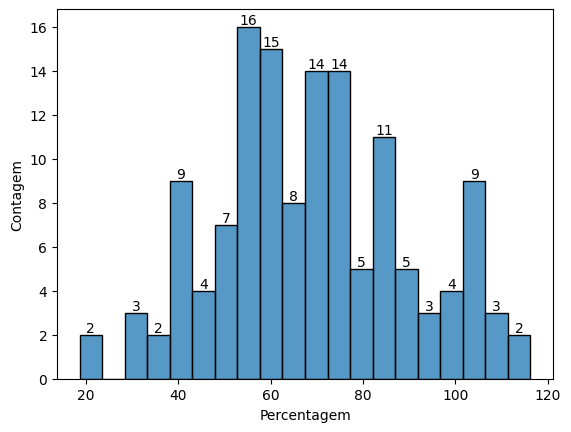

In [18]:
# Percentagem de capacidade dos veiculos
ax = sns.histplot(capacidade["Percentagem"], bins=20)

# Iterar sobre os patches (barras) do histograma para adicionar os valores
for p in ax.patches:
    height = int(p.get_height())
    if height > 0:  # Apenas anotar se a altura for maior que zero
        ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), 
                textcoords='offset points')
        
# Alterar o rótulo do eixo Y para "Contagem"
ax.set_ylabel("Contagem")

# Exibir o gráfico
plt.show()

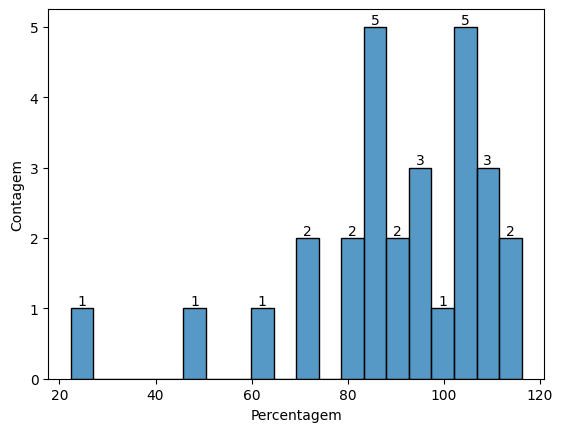

In [19]:
# Percentagem de capacidade de veiculos ligeiros

# Filtrar os dados pela coluna 'Tipologia' com o valor 'Ligeiro'
filtrado = capacidade[capacidade["Tipologia"] == "Ligeiro"]["Percentagem"]

# Criar o histograma
ax = sns.histplot(filtrado, bins=20)

# Adicionar os valores únicos de cada barra
for p in ax.patches:
    height = int(p.get_height())
    if height > 0:  # Apenas anotar se a altura for maior que zero
        ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 5), 
                textcoords='offset points')
        
# Alterar o rótulo do eixo Y para "Contagem"
ax.set_ylabel("Contagem")

# Exibir o gráfico
plt.show()

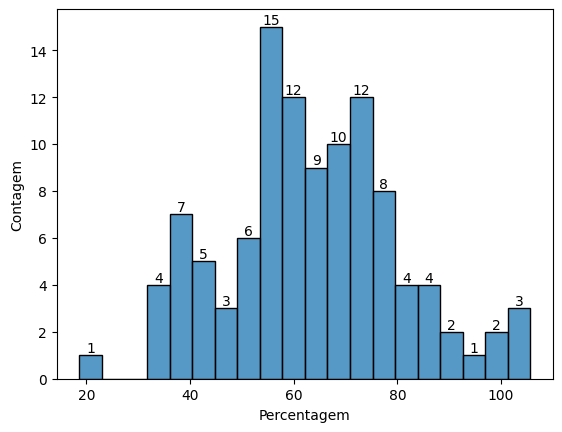

In [20]:
# Percentagem de capacidade de veiculos pesados

# Filtrar os dados pela coluna 'Tipologia' com o valor 'Pesado'
filtrado = capacidade[capacidade["Tipologia"] == "Pesado"]["Percentagem"]

# Criar o histograma
ax = sns.histplot(filtrado, bins=20)

# Adicionar os valores únicos de cada barra
for p in ax.patches:
    height = int(p.get_height())
    if height > 0:  # Apenas anotar se a altura for maior que zero
        ax.annotate(f'{height}', 
                    (p.get_x() + p.get_width() / 2., height), 
                    ha='center', va='center', xytext=(0, 5), 
                    textcoords='offset points')

# Alterar o rótulo do eixo Y para "Contagem"
ax.set_ylabel("Contagem")

# Exibir o gráfico
plt.show()

In [21]:
# Nº de vezes que o transporte foi sobrelotado
sum(capacidade["Percentagem"] >= 100)

14

In [22]:
df_dados_rota['Tipo de visita'].unique()

array(['Partida', 'Entrega', 'Chegada', nan, 'Recolha'], dtype=object)

In [23]:
# Vericação janela horaria com horario real
janelas = df_dados_rota[(df_dados_rota['Tipo de visita'] == "Entrega") | (df_dados_rota['Tipo de visita'] == "Recolha")].copy()
#janelas = janelas[['Janela Horária','Horário']]
janelas

,Data,Matrícula,Capacidade,Tipologia,Nome,Kg,Morada,Latitude,Longitude,Tipo de visita,Janela Horária,Horário,Visita,Distância,Referência Cliente,Transporte,Fornecimento,Sequência real,Horário real de entrega
1,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 1,160.13,"R. D. MANUEL BARBUDA E VASCONC,3810-498AVEIRO,...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,51.066,21012087.0,769710.0,2.019389e+09,2.0,09:39:28
2,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 2,135.47,"CC GLICINIAS PLAZA AVEIRO Loja,3810-419AVEIRO ...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,0.000,21006784.0,769710.0,2.019389e+09,1.0,09:13:02
3,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 3,241.19,"CC GLICINIAS PLAZA, LJ 2.09,3810-419AVEIRO, 38...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,0.000,11114246.0,769710.0,2.019389e+09,3.0,09:49:13
4,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 4,21.12,"R ESPINHO 47,3800-110AVEIRO, 3800-110 AVEIRO",40.629385,-8.650217,Entrega,08:00-19:00,09:00,6.0,0.746,11002692.0,769710.0,2.019389e+09,4.0,09:58:52
5,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 5,192.12,"R AIRES BARBOSA 38,3810-042AVEIRO - GLORIA, 38...",40.633425,-8.647794,Entrega,"09:00-11:30, 18:30-20:00",09:07,23.0,0.667,11056844.0,769710.0,2.019389e+09,5.0,10:10:30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2696,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 4,155.02,"ZN IND TABOEIRA Q SIMAO SUL,3800-055AVEIRO - E...",40.651677,-8.608998,Entrega,08:00-18:00,14:44,12.0,4.230,21002535.0,769400.0,2.019387e+09,8.0,15:58:33
2697,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 5,324.42,"R CELESTINO NETO N 5,3750-126AGUEDA, 3750-126 ...",40.572285,-8.444697,Entrega,"08:00-11:30, 15:00-18:00",15:16,15.0,18.953,11049824.0,769400.0,2.019387e+09,9.0,16:53:58
2698,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 6,158.89,"R COMERCIO S/N,3780-124ANADIA - SANGALHOS, 378...",40.486230,-8.469551,Entrega,08:00-19:00,15:45,19.0,12.077,11087080.0,769400.0,2.019387e+09,10.0,17:28:57
2699,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 7,102.94,"R VL N 40,3780-599ANADIA - VILARINHO BAIRRO, 3...",40.421542,-8.521223,Entrega,08:00-19:00,16:19,16.0,10.581,11059984.0,769400.0,2.019387e+09,3.0,12:33:43


In [24]:
janelas["Janela Horária"] = janelas["Janela Horária"].str.split(",")
janelas

,Data,Matrícula,Capacidade,Tipologia,Nome,Kg,Morada,Latitude,Longitude,Tipo de visita,Janela Horária,Horário,Visita,Distância,Referência Cliente,Transporte,Fornecimento,Sequência real,Horário real de entrega
1,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 1,160.13,"R. D. MANUEL BARBUDA E VASCONC,3810-498AVEIRO,...",40.626130,-8.645250,Entrega,[08:00-10:00],08:11,48.0,51.066,21012087.0,769710.0,2.019389e+09,2.0,09:39:28
2,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 2,135.47,"CC GLICINIAS PLAZA AVEIRO Loja,3810-419AVEIRO ...",40.626130,-8.645250,Entrega,[08:00-10:00],08:11,48.0,0.000,21006784.0,769710.0,2.019389e+09,1.0,09:13:02
3,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 3,241.19,"CC GLICINIAS PLAZA, LJ 2.09,3810-419AVEIRO, 38...",40.626130,-8.645250,Entrega,[08:00-10:00],08:11,48.0,0.000,11114246.0,769710.0,2.019389e+09,3.0,09:49:13
4,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 4,21.12,"R ESPINHO 47,3800-110AVEIRO, 3800-110 AVEIRO",40.629385,-8.650217,Entrega,[08:00-19:00],09:00,6.0,0.746,11002692.0,769710.0,2.019389e+09,4.0,09:58:52
5,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 5,192.12,"R AIRES BARBOSA 38,3810-042AVEIRO - GLORIA, 38...",40.633425,-8.647794,Entrega,"[09:00-11:30, 18:30-20:00]",09:07,23.0,0.667,11056844.0,769710.0,2.019389e+09,5.0,10:10:30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2696,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 4,155.02,"ZN IND TABOEIRA Q SIMAO SUL,3800-055AVEIRO - E...",40.651677,-8.608998,Entrega,[08:00-18:00],14:44,12.0,4.230,21002535.0,769400.0,2.019387e+09,8.0,15:58:33
2697,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 5,324.42,"R CELESTINO NETO N 5,3750-126AGUEDA, 3750-126 ...",40.572285,-8.444697,Entrega,"[08:00-11:30, 15:00-18:00]",15:16,15.0,18.953,11049824.0,769400.0,2.019387e+09,9.0,16:53:58
2698,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 6,158.89,"R COMERCIO S/N,3780-124ANADIA - SANGALHOS, 378...",40.486230,-8.469551,Entrega,[08:00-19:00],15:45,19.0,12.077,11087080.0,769400.0,2.019387e+09,10.0,17:28:57
2699,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 7,102.94,"R VL N 40,3780-599ANADIA - VILARINHO BAIRRO, 3...",40.421542,-8.521223,Entrega,[08:00-19:00],16:19,16.0,10.581,11059984.0,769400.0,2.019387e+09,3.0,12:33:43


In [25]:
# Verificação do horario real de entrega com a respetiva janela horária
def check_time_in_window(window, time):
    for interval in window:
        start, end = interval.split("-")
        start = datetime.strptime(start.strip(),'%H:%M').time()
        end = datetime.strptime(end.strip(),'%H:%M').time()
        if start <= time <= end:
            return True
    return False

janelas['Está na Janela?'] = janelas.apply(lambda row: check_time_in_window(row['Janela Horária'], row['Horário real de entrega']), axis=1)
print(f"Nº de janelas de entrega corretas: {sum(janelas['Está na Janela?'])}; Percentagem de janelas de entrega corretas: {sum(janelas['Está na Janela?'])/len(janelas['Está na Janela?'])*100}")

Nº de janelas de entrega corretas: 1811; Percentagem de janelas de entrega corretas: 78.26274848746759


In [26]:
# Quais as entregas que estão fora da janela horária
print(janelas[janelas['Está na Janela?']==False].to_string())

            Data   Matrícula  Capacidade Tipologia        Nome       Kg                                                                                                Morada   Latitude  Longitude Tipo de visita               Janela Horária Horário  Visita  Distância  Referência Cliente  Transporte  Fornecimento  Sequência real Horário real de entrega  Está na Janela?
7     01.04.2022    09-PZ-62      5500.0    Pesado   Cliente 7   144.49                                               R DR MARIO SACRAMENTO 1,3810-105AVEIRO, 3810-105 AVEIRO  40.634059  -8.648643        Entrega  [08:00-10:30,  15:00-18:30]   09:45    12.0      0.024          11111485.0    769710.0  2.019389e+09            10.0                11:25:09            False
11    01.04.2022    09-PZ-62      5500.0    Pesado  Cliente 11    57.82                                 AV ARTUR RAVARRA SN,3810-096AVEIRO - GLORIA, 3810-096 AVEIRO - GLORIA  40.636525  -8.654233        Entrega  [07:30-11:00,  16:00-21:00]   11:00     7.0     

In [27]:
# Verificação se a sequencia real está correta
df_sequencia = df_dados_rota[["Transporte","Sequência real"]]

# Remover linhas com valores NaN na coluna 'Sequência real'
df_sequencia.dropna(subset=['Sequência real'], inplace=True)

# Inicializar uma lista para armazenar os resultados
resultados = []

# Agrupar por transporte e verificar se o intervalo de valores contém todos os valores intermédios
for transporte, grupo in df_sequencia.groupby('Transporte'):
    sequencia = grupo['Sequência real'].tolist()
    minimo = min(sequencia)
    maximo = max(sequencia)
    intervalo = set(range(int(minimo), int(maximo) + 1))
    valores_faltantes = sorted(intervalo - set(sequencia))
    resultado = {"Transporte": transporte, "Valores_faltantes": valores_faltantes}
    resultados.append(resultado)

# Criar um novo DataFrame a partir dos resultados
df_resultado = pd.DataFrame(resultados)

# Print das rotas com valores sequenciais defeituosos
df_resultado[df_resultado['Valores_faltantes'].apply(len) != 0]


C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\2429252140.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_sequencia.dropna(subset=['Sequência real'], inplace=True)


,Transporte,Valores_faltantes
0,766218.0,[5]
1,766219.0,"[5, 9, 11, 13, 15, 18, 21, 24, 29]"
2,766220.0,"[10, 12, 16, 17, 21, 22]"
3,766221.0,"[3, 5]"
4,766222.0,"[5, 10, 12, 21, 24]"
5,766223.0,[2]
8,766436.0,"[3, 5, 7, 9, 13, 15, 18]"
43,767677.0,"[3, 7, 10]"
89,769400.0,"[2, 4]"
92,769711.0,[3]


In [28]:
# Percentagem de rotas defeituosas
df_resultado[df_resultado['Valores_faltantes'].apply(len) != 0].shape[0]/df_resultado[['Valores_faltantes']].count()[0]

0.1323529411764706

In [29]:
# Quantidade de produtos entregue por rota de fornecimento
df_produtos = df_composicao_remessa[["Fornecimento","Receb.merc","Nº do material"]]
df_produtos

,Fornecimento,Receb.merc,Nº do material
0,2019389293,21005938,"Um Bongo 8 Frutos 8x3 TET 0,20L"
1,2019389293,21005938,"Compal Clás Néc T. Frutti 18 TET0,33L Nv"
2,2019389293,21005938,"Compal Orig Néc Lar Algarv 18TET0,33L"
3,2019389294,21002745,"Compal Clás Néc Pêssego 15 GR 0,20L Nv"
4,2019389294,21002745,"Água Serra Estrela 24 GR 0,50L PET"
...,...,...,...
17709,2019387009,11068117,"Um Bongo 8 Frutos 8x3 TET 0,20L"
17710,2019387010,11060294,"Compal Vital Eq Manga Laranja 15 GR 0,2L"
17711,2019387010,11060294,"Água Serra Estrela 12 GR 1,5L PET"
17712,2019387010,11060294,"Sumol Lar 6 GR 1,5L PET"


In [30]:
# Devolver quais e quantos produtos 
contagem_recebimento_material = df_produtos.groupby(['Fornecimento', 'Receb.merc'])['Nº do material'].agg([('Count', 'count'), ('Nº do material', 'first')]).reset_index()

print(contagem_recebimento_material.to_string())

      Fornecimento  Receb.merc  Count                            Nº do material
0       2019356383    21006202      5  Compal Vital Eq Manga Laranja 15 GR 0,2L
1       2019356384    21011899     20         Água Serra Estrela 12 GR 1,5L PET
2       2019356385    21011940      9       Lipton Ice Tea PES 28 LT 0,33 Sleek
3       2019356386    21009619      5  Compal Clás Néc T. Frutti 18 TET0,33L Nv
4       2019356387    21006203      6  Compal Vital Aox Fr Vermelhos 15 GR0,20L
5       2019356388    21005904     24           Um Bongo 8 Frutos 8x3 TET 0,20L
6       2019356390    21009922     17       Lipton Ice Tea PES 28 LT 0,33 Sleek
7       2019356392    21010915      3         Água Serra Estrela 12 GR 1,5L PET
8       2019356393    21000240     15            Caixa vasilhame 24x0,25L Sumol
9       2019356394    21005868      3                   Sumol Lar 6 GR 0,5L PET
10      2019356395    21002723      9  Lipton Chá Ver Hort Lima 12X0,33L PET Nv
11      2019356396    21002724      3   

In [31]:
# Nº de rotas existentes
num_rotas = df_dados_rota['Transporte'].nunique()

print("Número total de rotas:", num_rotas)

Número total de rotas: 136


In [32]:
# Agrupar os dados pelo valor único na coluna 'Transporte' e converter as sequências correspondentes em listas
sequencias_por_transporte = df_sequencia.groupby('Transporte')['Sequência real'].apply(list).reset_index()
sequencias_por_transporte

,Transporte,Sequência real
0,766218.0,"[8.0, 7.0, 1.0, 2.0, 4.0, 3.0, 6.0, 9.0, 10.0]"
1,766219.0,"[33.0, 1.0, 16.0, 14.0, 17.0, 2.0, 3.0, 12.0, ..."
2,766220.0,"[13.0, 20.0, 19.0, 11.0, 18.0, 14.0, 7.0, 8.0,..."
3,766221.0,"[1.0, 2.0, 7.0, 4.0, 6.0, 8.0, 10.0, 11.0, 9.0..."
4,766222.0,"[4.0, 1.0, 2.0, 3.0, 16.0, 15.0, 14.0, 8.0, 13..."
...,...,...
131,771209.0,"[12.0, 15.0, 25.0, 16.0, 17.0, 1.0, 8.0, 9.0, ..."
132,771210.0,"[2.0, 1.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0,..."
133,771211.0,"[5.0, 4.0, 3.0, 14.0, 13.0, 12.0, 9.0, 8.0, 7...."
134,771212.0,"[1.0, 8.0, 2.0, 4.0, 3.0, 9.0, 7.0, 6.0, 5.0]"


In [33]:
# Inicializar uma lista para armazenar os resultados
resultados = []

# Agrupar por transporte e verificar se o intervalo de valores contém todos os valores intermédios
for transporte, grupo in df_sequencia.groupby('Transporte'):
    sequencia = grupo['Sequência real'].tolist()
    minimo = min(sequencia)
    maximo = max(sequencia)
    intervalo = set(range(int(minimo), int(maximo) + 1))
    valores_faltantes = sorted(intervalo - set(sequencia))
    resultado = {"Transporte": transporte, "Valores_faltantes": valores_faltantes}
    resultados.append(resultado)

# Criar um novo DataFrame a partir dos resultados
df_resultado = pd.DataFrame(resultados)

# Contar as linhas com listas vazias na coluna 'Valores_faltantes'
df_resultado = df_resultado[df_resultado['Valores_faltantes'].apply(len) != 0]

print(df_resultado)

     Transporte                   Valores_faltantes
0      766218.0                                 [5]
1      766219.0  [5, 9, 11, 13, 15, 18, 21, 24, 29]
2      766220.0            [10, 12, 16, 17, 21, 22]
3      766221.0                              [3, 5]
4      766222.0                 [5, 10, 12, 21, 24]
5      766223.0                                 [2]
8      766436.0            [3, 5, 7, 9, 13, 15, 18]
43     767677.0                          [3, 7, 10]
89     769400.0                              [2, 4]
92     769711.0                                 [3]
94     769713.0                             [9, 17]
99     769946.0                                [15]
102    769949.0                         [4, 13, 15]
108    770189.0                                 [9]
114    770428.0           [4, 6, 9, 11, 15, 21, 24]
115    770429.0                                [12]
116    770430.0                                 [6]
119    770694.0                                 [5]


In [34]:
# Filtrar o DataFrame para excluir as linhas correspondentes aos transportes que você quer remover
df_filtrado = sequencias_por_transporte[~sequencias_por_transporte['Transporte'].isin(df_resultado["Transporte"])]
df_filtrado

,Transporte,Sequência real
6,766434.0,"[2.0, 3.0, 5.0, 4.0, 6.0, 7.0, 1.0, 8.0, 9.0, ..."
7,766435.0,"[12.0, 5.0, 3.0, 9.0, 10.0, 1.0, 4.0, 15.0, 14..."
9,766437.0,"[4.0, 3.0, 12.0, 13.0, 1.0, 2.0, 11.0, 9.0, 7...."
10,766438.0,"[1.0, 3.0, 2.0, 6.0, 4.0, 5.0, 7.0, 8.0, 20.0,..."
11,766439.0,"[1.0, 2.0, 3.0, 5.0, 6.0, 4.0, 7.0, 11.0, 8.0,..."
...,...,...
131,771209.0,"[12.0, 15.0, 25.0, 16.0, 17.0, 1.0, 8.0, 9.0, ..."
132,771210.0,"[2.0, 1.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0,..."
133,771211.0,"[5.0, 4.0, 3.0, 14.0, 13.0, 12.0, 9.0, 8.0, 7...."
134,771212.0,"[1.0, 8.0, 2.0, 4.0, 3.0, 9.0, 7.0, 6.0, 5.0]"


In [35]:
# Função para criar a sequência de 1 até o tamanho da lista
def criar_sequencia(lista):
    return list(range(1, len(lista) + 1))

# Criar a nova coluna com as sequências
df_filtrado['Sequencia_numerica'] = df_filtrado['Sequência real'].apply(criar_sequencia)
df_filtrado

C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\2028815474.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtrado['Sequencia_numerica'] = df_filtrado['Sequência real'].apply(criar_sequencia)


,Transporte,Sequência real,Sequencia_numerica
6,766434.0,"[2.0, 3.0, 5.0, 4.0, 6.0, 7.0, 1.0, 8.0, 9.0, ...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
7,766435.0,"[12.0, 5.0, 3.0, 9.0, 10.0, 1.0, 4.0, 15.0, 14...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
9,766437.0,"[4.0, 3.0, 12.0, 13.0, 1.0, 2.0, 11.0, 9.0, 7....","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
10,766438.0,"[1.0, 3.0, 2.0, 6.0, 4.0, 5.0, 7.0, 8.0, 20.0,...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
11,766439.0,"[1.0, 2.0, 3.0, 5.0, 6.0, 4.0, 7.0, 11.0, 8.0,...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
...,...,...,...
131,771209.0,"[12.0, 15.0, 25.0, 16.0, 17.0, 1.0, 8.0, 9.0, ...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
132,771210.0,"[2.0, 1.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0,...","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
133,771211.0,"[5.0, 4.0, 3.0, 14.0, 13.0, 12.0, 9.0, 8.0, 7....","[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
134,771212.0,"[1.0, 8.0, 2.0, 4.0, 3.0, 9.0, 7.0, 6.0, 5.0]","[1, 2, 3, 4, 5, 6, 7, 8, 9]"


In [36]:
# Aplicar a função a cada linha do DataFrame(Distancia Hamming-> quao semelhante as sequencias são)
df_filtrado['Distancia_Hamming'] = df_filtrado.apply(lambda row: hamming(row['Sequencia_numerica'], row['Sequência real']), axis=1)
df_filtrado["Distancia_Hamming"] = 1 - df_filtrado["Distancia_Hamming"]
print(df_filtrado.to_string())

     Transporte                                                                                                                                                                                 Sequência real                                                                                                           Sequencia_numerica  Distancia_Hamming
6      766434.0                                                                                      [2.0, 3.0, 5.0, 4.0, 6.0, 7.0, 1.0, 8.0, 9.0, 11.0, 10.0, 18.0, 19.0, 13.0, 12.0, 15.0, 14.0, 16.0, 17.0]                                                          [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]           0.157895
7      766435.0                                                                                                  [12.0, 5.0, 3.0, 9.0, 10.0, 1.0, 4.0, 15.0, 14.0, 16.0, 8.0, 13.0, 6.0, 11.0, 7.0, 2.0, 17.0]                                                                  [1, 2, 3, 4, 5, 6, 7, 8, 9

C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\671400260.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtrado['Distancia_Hamming'] = df_filtrado.apply(lambda row: hamming(row['Sequencia_numerica'], row['Sequência real']), axis=1)
C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\671400260.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtrado["Distancia_Hamming"] = 1 - df_filtrado["Distancia_Hamming"]


In [37]:
# Calcula a média da coluna 'Distancia_Hamming'
media_hamming = df_filtrado["Distancia_Hamming"].mean()

# Exibe a média
print(f"A média da Distância de Hamming é: {media_hamming}")

A média da Distância de Hamming é: 0.1960431930204968


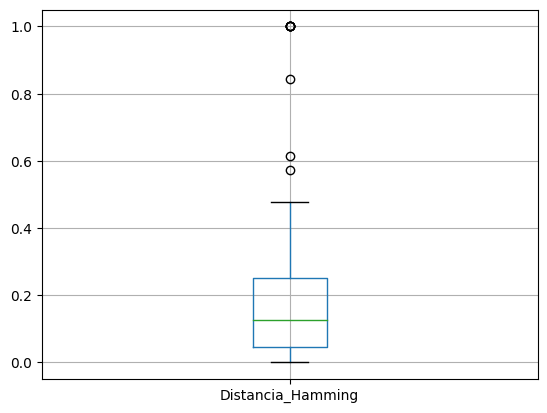

In [38]:
# Análise do boxplot para a distance hamming
df_filtrado[["Distancia_Hamming"]].boxplot()
plt.show()

In [39]:
# Analise descriminativa da distance hamming
df_filtrado[["Distancia_Hamming"]].describe()

,Distancia_Hamming
count,118.000000
mean,0.196043
std,0.238486
min,0.000000
25%,0.045455
50%,0.125000
75%,0.250000
max,1.000000


In [40]:
# Função para calcular o par latitude e longitude para cada grupo
def calcular_par_lat_lon(group):
    if 'Latitude' in group.columns and 'Longitude' in group.columns:
        return group[['Latitude', 'Longitude']].values
    else:
        return []

# Coordenadas pela Rota Programada -  Agrupar pelo transporte e aplicar a função
coordenadasP = df_dados_rota.groupby('Transporte').apply(calcular_par_lat_lon)
coordenadasP

Transporte
766218.0    [[40.24435, -8.44365], [39.659386, -7.668292],...
766219.0    [[40.24435, -8.44365], [40.525723, -8.599585],...
766220.0    [[40.24435, -8.44365], [40.484916, -8.473722],...
766221.0    [[40.24435, -8.44365], [40.227476, -8.529563],...
766222.0    [[40.24435, -8.44365], [40.212193, -8.430955],...
                                  ...                        
771209.0    [[40.24435, -8.44365], [40.484916, -8.473722],...
771210.0    [[40.24435, -8.44365], [40.214442, -8.433477],...
771211.0    [[40.24435, -8.44365], [40.208852, -8.429084],...
771212.0    [[40.24435, -8.44365], [39.812039, -7.527841],...
771213.0    [[40.24435, -8.44365], [39.574101, -7.782636],...
Length: 136, dtype: object

In [41]:
# Definindo Sequência Real como 0 onde o Tipo de visita é 'Partida' e como 999 onde é 'Chegada'
aux = df_dados_rota.copy()
aux['Sequência real'] = aux.apply(lambda row: 0 if row['Tipo de visita'] == 'Partida' else (999 if row['Tipo de visita'] == 'Chegada' else row['Sequência real']), axis=1)
aux

,Data,Matrícula,Capacidade,Tipologia,Nome,Kg,Morada,Latitude,Longitude,Tipo de visita,Janela Horária,Horário,Visita,Distância,Referência Cliente,Transporte,Fornecimento,Sequência real,Horário real de entrega
0,01.04.2022,09-PZ-62,5500.0,Pesado,1090 - Coimbra,2988.92,"Rua do Cardal 7, 3025 Coimbra, Portugal, 3025,...",40.244350,-8.443650,Partida,00:00-00:00+3,07:05,0.0,0.000,NaN,769710.0,NaN,0.0,NaN
1,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 1,160.13,"R. D. MANUEL BARBUDA E VASCONC,3810-498AVEIRO,...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,51.066,21012087.0,769710.0,2.019389e+09,2.0,09:39:28
2,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 2,135.47,"CC GLICINIAS PLAZA AVEIRO Loja,3810-419AVEIRO ...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,0.000,21006784.0,769710.0,2.019389e+09,1.0,09:13:02
3,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 3,241.19,"CC GLICINIAS PLAZA, LJ 2.09,3810-419AVEIRO, 38...",40.626130,-8.645250,Entrega,08:00-10:00,08:11,48.0,0.000,11114246.0,769710.0,2.019389e+09,3.0,09:49:13
4,01.04.2022,09-PZ-62,5500.0,Pesado,Cliente 4,21.12,"R ESPINHO 47,3800-110AVEIRO, 3800-110 AVEIRO",40.629385,-8.650217,Entrega,08:00-19:00,09:00,6.0,0.746,11002692.0,769710.0,2.019389e+09,4.0,09:58:52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2697,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 5,324.42,"R CELESTINO NETO N 5,3750-126AGUEDA, 3750-126 ...",40.572285,-8.444697,Entrega,"08:00-11:30, 15:00-18:00",15:16,15.0,18.953,11049824.0,769400.0,2.019387e+09,9.0,16:53:58
2698,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 6,158.89,"R COMERCIO S/N,3780-124ANADIA - SANGALHOS, 378...",40.486230,-8.469551,Entrega,08:00-19:00,15:45,19.0,12.077,11087080.0,769400.0,2.019387e+09,10.0,17:28:57
2699,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 7,102.94,"R VL N 40,3780-599ANADIA - VILARINHO BAIRRO, 3...",40.421542,-8.521223,Entrega,08:00-19:00,16:19,16.0,10.581,11059984.0,769400.0,2.019387e+09,3.0,12:33:43
2700,31.03.2022,AA-41-RS/2,1200.0,Ligeiro,Cliente 8,127.00,"EST PRINCIPAL,3780-597ANADIA - VILARINHO BAIRR...",40.418155,-8.560282,Entrega,"08:00-11:30, 15:00-19:00",16:40,18.0,3.488,11049474.0,769400.0,2.019387e+09,1.0,12:10:31


In [42]:
# Coordenadas pela Rota Efetuada - Agrupar pelo transporte, ordenar pela Sequência Real e aplicar a função
coordenadasE = aux.sort_values(by='Sequência real').groupby("Transporte").apply(calcular_par_lat_lon)
coordenadasE

Transporte
766218.0    [[40.24435, -8.44365], [39.812039, -7.527841],...
766219.0    [[40.24435, -8.44365], [40.56347, -8.612702], ...
766220.0    [[40.24435, -8.44365], [40.635625, -8.645416],...
766221.0    [[40.24435, -8.44365], [40.227476, -8.529563],...
766222.0    [[40.24435, -8.44365], [40.206709, -8.428961],...
                                  ...                        
771209.0    [[40.24435, -8.44365], [40.555037, -8.460555],...
771210.0    [[40.24435, -8.44365], [40.221872, -8.431175],...
771211.0    [[40.24435, -8.44365], [40.212506, -8.443551],...
771212.0    [[40.24435, -8.44365], [39.812039, -7.527841],...
771213.0    [[40.24435, -8.44365], [39.574101, -7.782636],...
Length: 136, dtype: object

In [43]:
# Ficheiro 1-4-2022 
# Rota de Transporte: 769710

# Coordenadas dos pontos da rota programada
rotaProgramada = coordenadasP[769710]

# Coordenadas dos pontos da rota efetuada
rotaEfetuada = coordenadasE[769710]

# Criar um mapa centrado em uma coordenada inicial
mapa = folium.Map(location=rotaProgramada[0], zoom_start=6)

# Adicionar marcadores para os pontos da rota Programada 
for i, pontoP in enumerate(rotaProgramada):
    folium.Marker(location=pontoP, popup=f'PontoP {i+1}').add_to(mapa)

# Traçar a linha da rota Programada
folium.PolyLine(locations=rotaProgramada, color="blue", weight=5, opacity=1).add_to(mapa)

# Traçar a linha da rota Efetuada
folium.PolyLine(locations=rotaEfetuada, color="red", weight=2.5, opacity=1, popup='Rota 2').add_to(mapa)

# Exibir o mapa
mapa

In [44]:
# Calculo da distancia total percorrida em Km pelas rotas programada e efetuada
def calcular_distancias(coordenadasP, coordenadasE):
    distancias = []
    for rota in coordenadasP.keys():
        distanciaP = 0
        grupo = coordenadasP[rota]
        PontoAnterior = grupo[0]
        for ponto in grupo[1:]: 
            distanciaP += haversine(PontoAnterior, ponto)
            PontoAnterior = ponto
        distanciaE = 0
        grupo = coordenadasE[rota]
        PontoAnterior = grupo[0]
        for ponto in grupo[1:]: 
            distanciaE += haversine(PontoAnterior, ponto)
            PontoAnterior = ponto
        distancias.append({'Rota': rota, 'Distancia Programada (km)': distanciaP, 'Distancia Efetuada (km)': distanciaE})
    return pd.DataFrame(distancias)

# Calcular as distâncias e armazená-las em um DataFrame
df_distancias = calcular_distancias(coordenadasP, coordenadasE)

# Diferença de distancias das rotas
df_distancias["Diferença"] = df_distancias["Distancia Efetuada (km)"] - df_distancias["Distancia Programada (km)"]

# Exibir o DataFrame com as distâncias
print(df_distancias)

         Rota  Distancia Programada (km)  Distancia Efetuada (km)  Diferença
0    766218.0                 247.182717               225.279711 -21.903006
1    766219.0                 115.703407               124.381768   8.678361
2    766220.0                 100.360068               117.659172  17.299104
3    766221.0                  95.669566               103.485775   7.816209
4    766222.0                  61.219633                70.088303   8.868669
..        ...                        ...                      ...        ...
131  771209.0                 112.115474               124.969027  12.853552
132  771210.0                  89.057752                92.190043   3.132292
133  771211.0                  88.414715                91.195877   2.781162
134  771212.0                 193.287582               192.191511  -1.096071
135  771213.0                 228.402567               238.228256   9.825689

[136 rows x 4 columns]


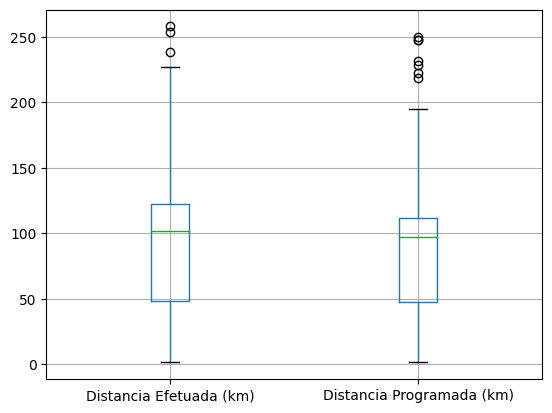

In [45]:
# Boxplots das distancias 
df_distancias[["Distancia Efetuada (km)","Distancia Programada (km)"]].boxplot()
plt.show()

In [46]:
# Analise descriminativa da distancia efetuada
df_distancias[["Distancia Efetuada (km)"]].describe()

,Distancia Efetuada (km)
count,136.000000
mean,94.755141
std,55.787605
min,1.338396
25%,48.621916
50%,101.531690
75%,122.178568
max,257.861487


In [47]:
# Analise descriminativa da distancia programada
df_distancias[["Distancia Programada (km)"]].describe()

,Distancia Programada (km)
count,136.000000
mean,89.068592
std,53.827094
min,1.338396
25%,47.728663
50%,96.954434
75%,111.714375
max,249.648403


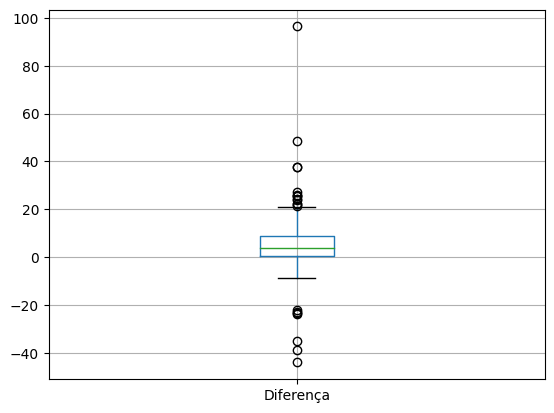

In [48]:
# Boxplot da diferença de distancias 
df_distancias[["Diferença"]].boxplot()
plt.show()

In [49]:
# Duração das rotas efetuadas
# Removendo linhas com Nan da coluna 'Horario_real_de_entrega'
df_duraçao_rotas = df_dados_rota.dropna(subset=['Horário real de entrega'])

# Convertendo a coluna 'Horario_real_de_entrega' para tipo datetime
df_duraçao_rotas['Horário real de entrega'] = pd.to_datetime(df_duraçao_rotas['Horário real de entrega'], format='%H:%M:%S', errors='coerce')

# Agrupando o DataFrame por 'Transporte' e calculando a diferença entre o primeiro e o último horário
duracao_total_rotas = df_duraçao_rotas.groupby('Transporte')['Horário real de entrega'].apply(lambda x: (max(x) - min(x)))

print(duracao_total_rotas)

Transporte
766218.0   0 days 04:27:29
766219.0   0 days 05:30:46
766220.0   0 days 05:02:58
766221.0   0 days 04:20:05
766222.0   0 days 06:21:06
                 ...      
771209.0   0 days 06:41:52
771210.0   0 days 07:34:48
771211.0   0 days 07:55:28
771212.0   0 days 04:43:47
771213.0   0 days 03:38:17
Name: Horário real de entrega, Length: 136, dtype: timedelta64[ns]


C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\203999210.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_duraçao_rotas['Horário real de entrega'] = pd.to_datetime(df_duraçao_rotas['Horário real de entrega'], format='%H:%M:%S', errors='coerce')


In [50]:
# Duração das rotas programadas
# Removendo linhas com Nan da coluna 'Horario_real_de_entrega'
df_duraçao_rotas_prog = df_dados_rota.dropna(subset=['Horário real de entrega'])

# Convertendo a coluna 'Horário' para tipo datetime
df_duraçao_rotas_prog['Horário'] = pd.to_datetime(df_duraçao_rotas_prog['Horário'], format='%H:%M', errors='coerce')

# Agrupando o DataFrame por 'Transporte' e calculando a diferença entre o primeiro e o último horário
duracao_total_rotas_prog = df_duraçao_rotas_prog.groupby('Transporte')['Horário'].apply(lambda x: (max(x) - min(x)))

print(duracao_total_rotas_prog)

Transporte
766218.0   0 days 05:21:00
766219.0   0 days 07:08:00
766220.0   0 days 05:56:00
766221.0   0 days 05:04:00
766222.0   0 days 07:20:00
                 ...      
771209.0   0 days 07:36:00
771210.0   0 days 06:40:00
771211.0   0 days 08:01:00
771212.0   0 days 05:06:00
771213.0   0 days 02:43:00
Name: Horário, Length: 136, dtype: timedelta64[ns]


C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\1975537172.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_duraçao_rotas_prog['Horário'] = pd.to_datetime(df_duraçao_rotas_prog['Horário'], format='%H:%M', errors='coerce')


In [51]:
# Diferença entre a rota efetuada e a dada pelo programa 

# Juntar os DataFrames com base no ID 'Transporte'
merged_df = pd.merge(duracao_total_rotas, duracao_total_rotas_prog, on='Transporte')

# Subtrair as colunas 'Duração_prog' de 'Duração'
merged_df['Diferença_duração'] = merged_df['Horário real de entrega'] - merged_df['Horário']

# Convertendo valores negativos para positivos
merged_df['Diferença_duração'] = merged_df['Diferença_duração'].apply(lambda x: pd.Timedelta(days=x.days * -1, seconds=x.seconds))

# Convertendo valores excedentes de 24 horas
merged_df['Diferença_duração'] = merged_df['Diferença_duração'].apply(lambda x: pd.Timedelta(days=1) - x if x.days > 0 else x)
merged_df


,Horário real de entrega,Horário,Diferença_duração
Transporte,,,
766218.0,0 days 04:27:29,0 days 05:21:00,-1 days +00:53:31
766219.0,0 days 05:30:46,0 days 07:08:00,-1 days +01:37:14
766220.0,0 days 05:02:58,0 days 05:56:00,-1 days +00:53:02
766221.0,0 days 04:20:05,0 days 05:04:00,-1 days +00:43:55
766222.0,0 days 06:21:06,0 days 07:20:00,-1 days +00:58:54
...,...,...,...
771209.0,0 days 06:41:52,0 days 07:36:00,-1 days +00:54:08
771210.0,0 days 07:34:48,0 days 06:40:00,0 days 00:54:48
771211.0,0 days 07:55:28,0 days 08:01:00,-1 days +00:05:32


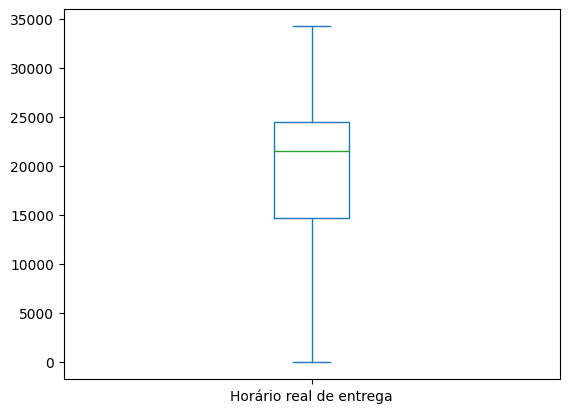

In [52]:
# Boxplots das duraçoes para a coluna 'Horário real de entrega'
merged_df['Horário real de entrega'].dt.seconds.plot(kind='box')
plt.show()

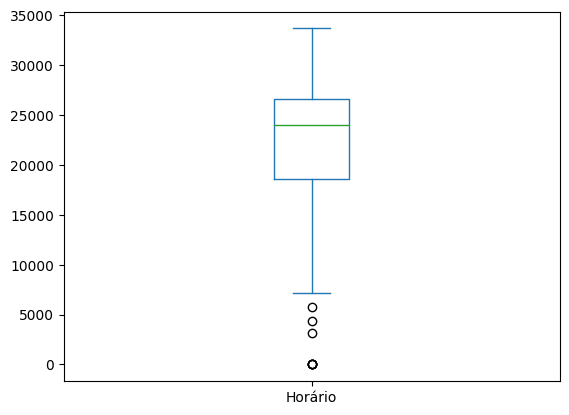

In [53]:
# Boxplot das duraçoes para a coluna 'Horário'
merged_df['Horário'].dt.seconds.plot(kind='box')
plt.show()

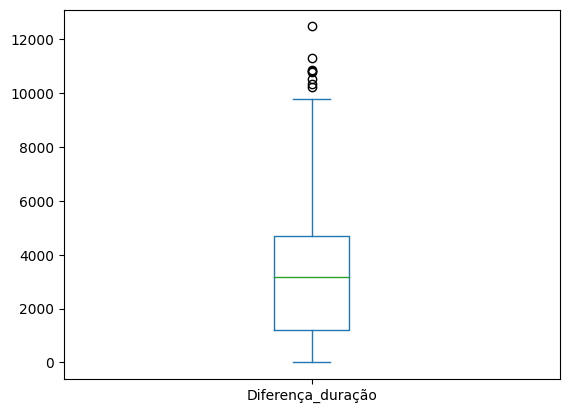

In [54]:
# Boxplot das duraçoes para a coluna 'Diferença_duração'(valor absoluto)
merged_df['Diferença_duração'].dt.seconds.plot(kind='box')
plt.show()

In [55]:
# Categorização de durações efetuadas

# Definindo as categorias de tempo
categorias = ['Intervalo de Tempo [0-2]', 'Intervalo de Tempo [2-4]', 'Intervalo de Tempo [4-8]', 'Intervalo de Tempo [8-24]']

# Definindo os limites de cada categoria
limites = [pd.Timedelta(hours=0), pd.Timedelta(hours=2), pd.Timedelta(hours=4), pd.Timedelta(hours=8), pd.Timedelta(hours=24)]

# Categorizando os resultados
duracao_total_rotas['Categoria Efetuada'] = pd.cut(duracao_total_rotas, bins=limites, labels=categorias)
duracao_total_rotas['Categoria Efetuada']

Transporte
766218.0    Intervalo de Tempo [4-8]
766219.0    Intervalo de Tempo [4-8]
766220.0    Intervalo de Tempo [4-8]
766221.0    Intervalo de Tempo [4-8]
766222.0    Intervalo de Tempo [4-8]
                      ...           
771209.0    Intervalo de Tempo [4-8]
771210.0    Intervalo de Tempo [4-8]
771211.0    Intervalo de Tempo [4-8]
771212.0    Intervalo de Tempo [4-8]
771213.0    Intervalo de Tempo [2-4]
Name: Horário real de entrega, Length: 136, dtype: category
Categories (4, object): ['Intervalo de Tempo [0-2]' < 'Intervalo de Tempo [2-4]' < 'Intervalo de Tempo [4-8]' < 'Intervalo de Tempo [8-24]']

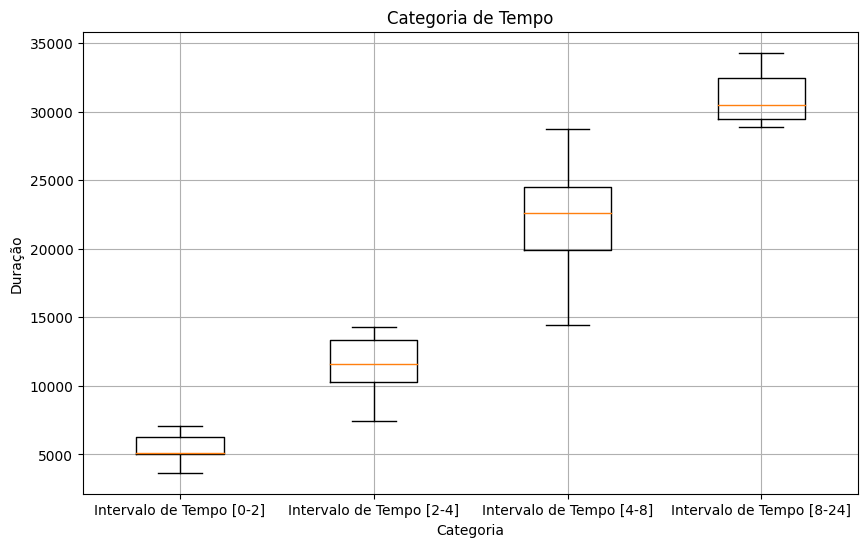

In [56]:
# Boxplot para a categorização de durações efetuadas
plt.figure(figsize=(10, 6))
duracoes_por_categoria = []

for categoria in categorias:
    aux = duracao_total_rotas.index.drop("Categoria Efetuada")[duracao_total_rotas['Categoria Efetuada'] == categoria]
    duracoes_por_categoria.append(merged_df['Horário real de entrega'][aux].dt.seconds)

plt.boxplot(duracoes_por_categoria, labels=categorias)
plt.title('Categoria de Tempo')
plt.xlabel('Categoria')
plt.ylabel('Duração')
plt.grid(True)
plt.show()

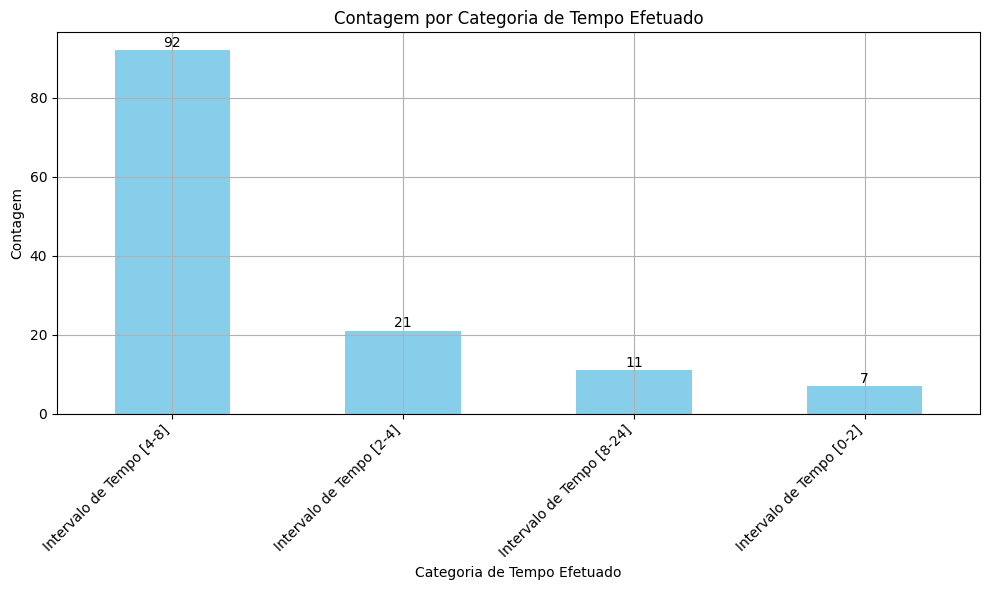

In [57]:
# Grafico de barras para as durações efetuadas

# Contar o número de ocorrências em cada categoria
contagem_por_categoria = duracao_total_rotas['Categoria Efetuada'].value_counts()

# Obter valores absolutos
valores_absolutos = contagem_por_categoria.abs()

# Criar o gráfico de barras
plt.figure(figsize=(10, 6))
ax = valores_absolutos.plot(kind='bar', color='skyblue')

# Adicionar rótulos e título
plt.title('Contagem por Categoria de Tempo Efetuado')
plt.xlabel('Categoria de Tempo Efetuado')
plt.ylabel('Contagem')
plt.grid(True)

# Rotacionar os rótulos do eixo x para melhor legibilidade
plt.xticks(rotation=45, ha='right')

# Adicionar os valores absolutos no topo das barras
for i in ax.patches:
    ax.text(i.get_x() + i.get_width() / 2, i.get_height() + 0.1, str(i.get_height()), ha='center', va='bottom')

# Mostrar o gráfico
plt.tight_layout()
plt.show()


In [58]:
# Obtendo a contagem de durações efetuadas em cada categoria
duracao_total_rotas['Categoria Efetuada'].value_counts()

Intervalo de Tempo [4-8]     92
Intervalo de Tempo [2-4]     21
Intervalo de Tempo [8-24]    11
Intervalo de Tempo [0-2]      7
Name: Horário real de entrega, dtype: int64

In [59]:
# Procurar por uma rota especifica
duracao_total_rotas['Categoria Efetuada'][766218]

'Intervalo de Tempo [4-8]'

In [60]:
# Categorização de durações programadas

# Definindo as categorias de tempo
categorias = ['Intervalo de Tempo [0-2]', 'Intervalo de Tempo [2-4]', 'Intervalo de Tempo [4-8]', 'Intervalo de Tempo [8-24]']

# Definindo os limites de cada categoria
limites = [pd.Timedelta(hours=0), pd.Timedelta(hours=2), pd.Timedelta(hours=4), pd.Timedelta(hours=8), pd.Timedelta(hours=24)]

# Categorizando os resultados
duracao_total_rotas_prog['Categoria Programada'] = pd.cut(duracao_total_rotas_prog, bins=limites, labels=categorias)
duracao_total_rotas_prog['Categoria Programada']


Transporte
766218.0     Intervalo de Tempo [4-8]
766219.0     Intervalo de Tempo [4-8]
766220.0     Intervalo de Tempo [4-8]
766221.0     Intervalo de Tempo [4-8]
766222.0     Intervalo de Tempo [4-8]
                      ...            
771209.0     Intervalo de Tempo [4-8]
771210.0     Intervalo de Tempo [4-8]
771211.0    Intervalo de Tempo [8-24]
771212.0     Intervalo de Tempo [4-8]
771213.0     Intervalo de Tempo [2-4]
Name: Horário, Length: 136, dtype: category
Categories (4, object): ['Intervalo de Tempo [0-2]' < 'Intervalo de Tempo [2-4]' < 'Intervalo de Tempo [4-8]' < 'Intervalo de Tempo [8-24]']

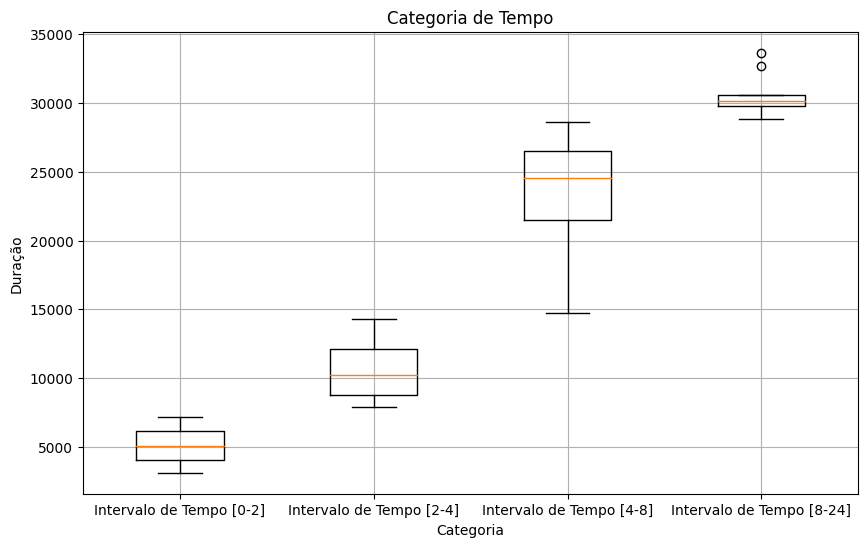

In [61]:
# Boxplot para a categorização de durações programadas
plt.figure(figsize=(10, 6))
duracoes_por_categoria = []

for categoria in categorias:
    aux = duracao_total_rotas_prog.index.drop("Categoria Programada")[duracao_total_rotas_prog['Categoria Programada'] == categoria]
    duracoes_por_categoria.append(merged_df['Horário'][aux].dt.seconds)

plt.boxplot(duracoes_por_categoria, labels=categorias)
plt.title('Categoria de Tempo')
plt.xlabel('Categoria')
plt.ylabel('Duração')
plt.grid(True)
plt.show()

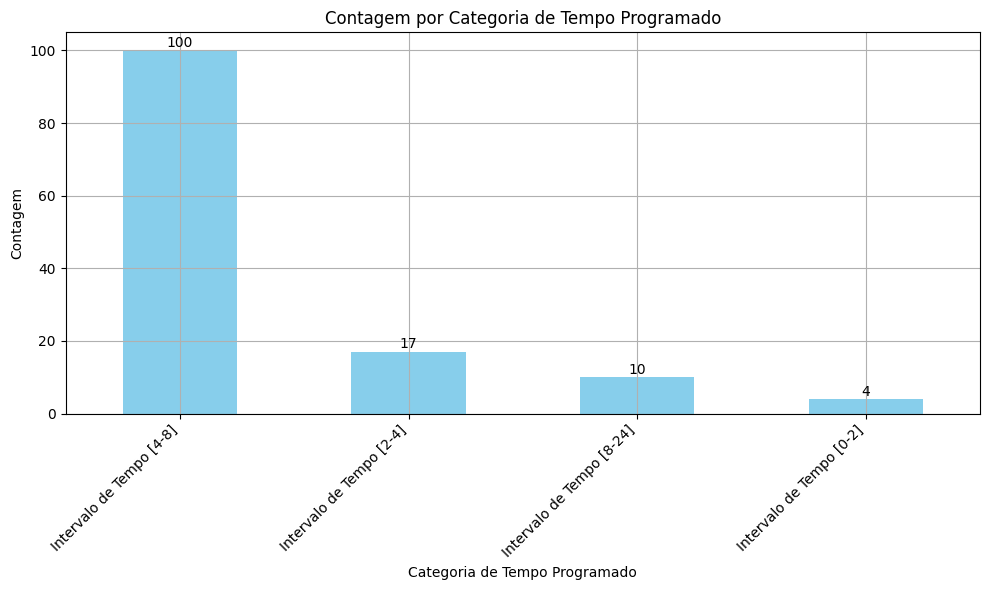

In [62]:
# Grafico de barras para as durações programadas

# Contar o número de ocorrências em cada categoria
contagem_por_categoria = duracao_total_rotas_prog['Categoria Programada'].value_counts()

# Criar o gráfico de barras
plt.figure(figsize=(10, 6))
ax = contagem_por_categoria.plot(kind='bar', color='skyblue')

# Adicionar rótulos e título
plt.title('Contagem por Categoria de Tempo Programado')
plt.xlabel('Categoria de Tempo Programado')
plt.ylabel('Contagem')
plt.grid(True)

# Rotacionar os rótulos do eixo x para melhor legibilidade
plt.xticks(rotation=45, ha='right')

# Adicionar os valores absolutos no topo das barras
for i in ax.patches:
    ax.text(i.get_x() + i.get_width() / 2, i.get_height() + 0.1, str(i.get_height()), ha='center', va='bottom')

# Mostrar o gráfico
plt.tight_layout()
plt.show()

In [63]:
# Obtendo a contagem de durações programadas em cada categoria
duracao_total_rotas_prog['Categoria Programada'].value_counts()

Intervalo de Tempo [4-8]     100
Intervalo de Tempo [2-4]      17
Intervalo de Tempo [8-24]     10
Intervalo de Tempo [0-2]       4
Name: Horário, dtype: int64

In [64]:
# Categorização de distancias 

# Definindo as categorias de tempo
categorias = ['Int Distancia [0-50]', 'Int Distancia [50-100]', 'Int Distancia [100-150]', 
              'Int Distancia [150-200]','Int Distancia [200-250]']

# Definindo os limites de cada categoria
limites = [0,50,100,150,200,250]

# Categorizando os resultados
df_distancias['Categoria Efetuada'] = pd.cut(df_distancias["Distancia Efetuada (km)"], bins=limites, labels=categorias)
df_distancias['Categoria Programada'] = pd.cut(df_distancias["Distancia Programada (km)"], bins=limites, labels=categorias)

df_distancias

,Rota,Distancia Programada (km),Distancia Efetuada (km),Diferença,Categoria Efetuada,Categoria Programada
0,766218.0,247.182717,225.279711,-21.903006,Int Distancia [200-250],Int Distancia [200-250]
1,766219.0,115.703407,124.381768,8.678361,Int Distancia [100-150],Int Distancia [100-150]
2,766220.0,100.360068,117.659172,17.299104,Int Distancia [100-150],Int Distancia [100-150]
3,766221.0,95.669566,103.485775,7.816209,Int Distancia [100-150],Int Distancia [50-100]
4,766222.0,61.219633,70.088303,8.868669,Int Distancia [50-100],Int Distancia [50-100]
...,...,...,...,...,...,...
131,771209.0,112.115474,124.969027,12.853552,Int Distancia [100-150],Int Distancia [100-150]
132,771210.0,89.057752,92.190043,3.132292,Int Distancia [50-100],Int Distancia [50-100]
133,771211.0,88.414715,91.195877,2.781162,Int Distancia [50-100],Int Distancia [50-100]
134,771212.0,193.287582,192.191511,-1.096071,Int Distancia [150-200],Int Distancia [150-200]


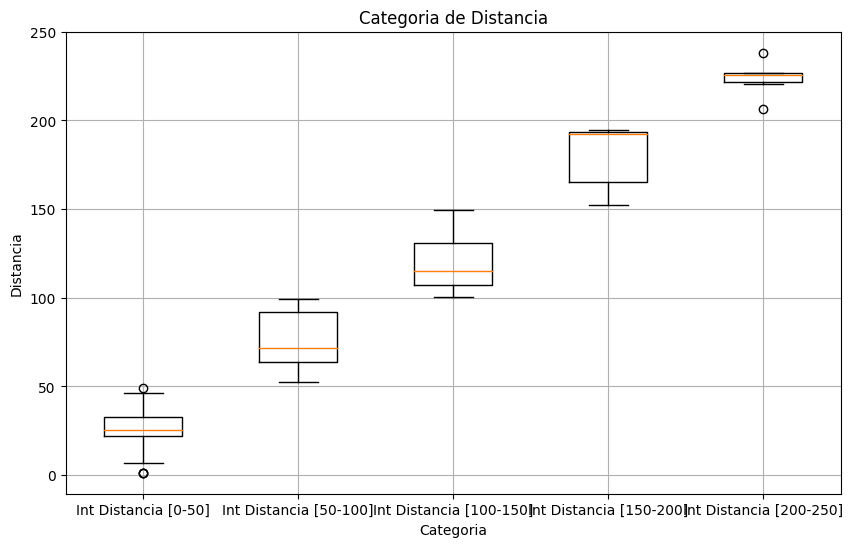

In [65]:
# Boxplot para a categorização de distancias efetuadas
plt.figure(figsize=(10, 6))
distancias_por_categoria = []

for categoria in categorias:
    aux = df_distancias[df_distancias['Categoria Efetuada'] == categoria]
    distancias_por_categoria.append(aux["Distancia Efetuada (km)"])

plt.boxplot(distancias_por_categoria, labels=categorias)
plt.title('Categoria de Distancia')
plt.xlabel('Categoria')
plt.ylabel('Distancia')
plt.grid(True)
plt.show()

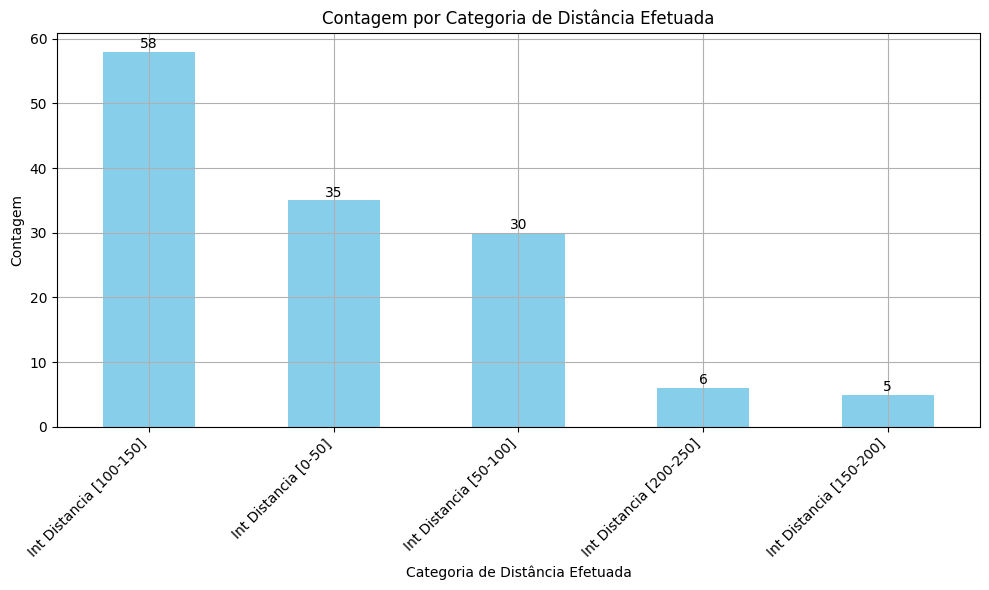

In [66]:
# Grafico de barras para as distancias efetuadas

# Contar o número de ocorrências em cada categoria
contagem_por_categoria = df_distancias['Categoria Efetuada'].value_counts()

# Criar o gráfico de barras
plt.figure(figsize=(10, 6))
ax = contagem_por_categoria.plot(kind='bar', color='skyblue')

# Adicionar rótulos e título
plt.title('Contagem por Categoria de Distância Efetuada')
plt.xlabel('Categoria de Distância Efetuada')
plt.ylabel('Contagem')
plt.grid(True)

# Rotacionar os rótulos do eixo x para melhor legibilidade
plt.xticks(rotation=45, ha='right')

# Adicionar os valores absolutos no topo das barras
for i in ax.patches:
    ax.text(i.get_x() + i.get_width() / 2, i.get_height() + 0.1, str(i.get_height()), ha='center', va='bottom')

# Mostrar o gráfico
plt.tight_layout()
plt.show()

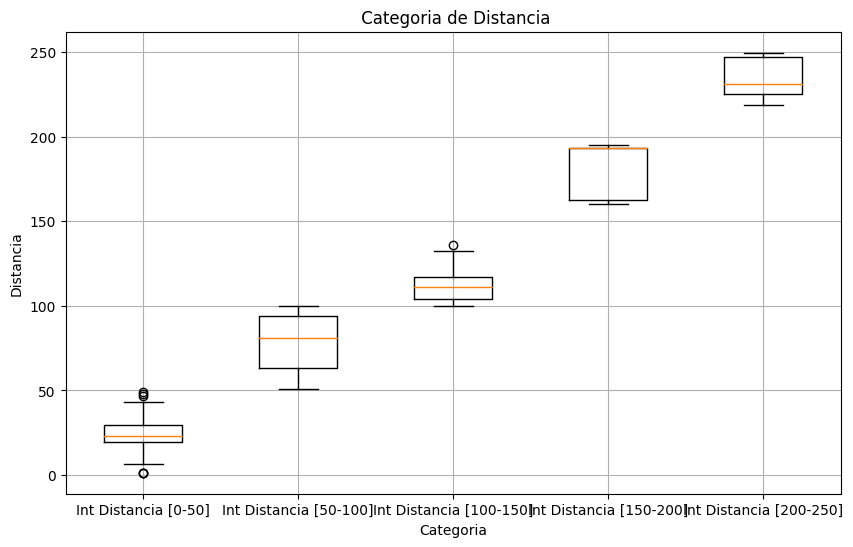

In [67]:
# Boxplot para a categorização de distancias programadas
plt.figure(figsize=(10, 6))
distancias_por_categoria = []

for categoria in categorias:
    aux = df_distancias[df_distancias['Categoria Programada'] == categoria]
    distancias_por_categoria.append(aux["Distancia Programada (km)"])

plt.boxplot(distancias_por_categoria, labels=categorias)
plt.title(' Categoria de Distancia')
plt.xlabel('Categoria')
plt.ylabel('Distancia')
plt.grid(True)
plt.show()

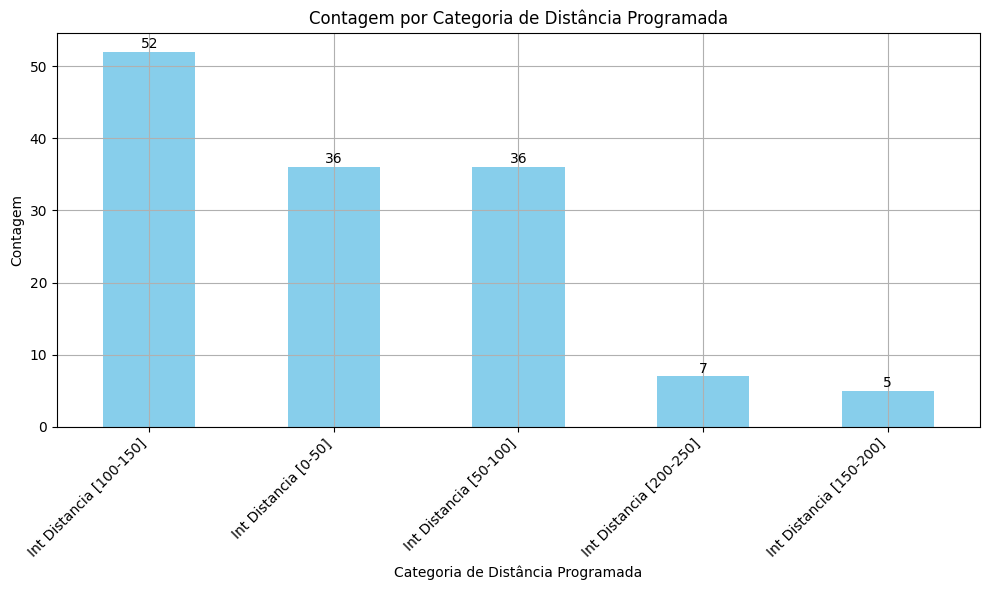

In [68]:
# Grafico de barras para as distancias programadas

# Contar o número de ocorrências em cada categoria
contagem_por_categoria = df_distancias['Categoria Programada'].value_counts()

# Criar o gráfico de barras
plt.figure(figsize=(10, 6))
ax = contagem_por_categoria.plot(kind='bar', color='skyblue')

# Adicionar rótulos e título
plt.title('Contagem por Categoria de Distância Programada')
plt.xlabel('Categoria de Distância Programada')
plt.ylabel('Contagem')
plt.grid(True)

# Rotacionar os rótulos do eixo x para melhor legibilidade
plt.xticks(rotation=45, ha='right')

# Adicionar os valores absolutos no topo das barras
for i in ax.patches:
    ax.text(i.get_x() + i.get_width() / 2, i.get_height() + 0.1, str(i.get_height()), ha='center', va='bottom')

# Mostrar o gráfico
plt.tight_layout()
plt.show()

In [69]:
# Obtendo a contagem das distancias efetuadas em cada categoria
df_distancias['Categoria Efetuada'].value_counts()

Int Distancia [100-150]    58
Int Distancia [0-50]       35
Int Distancia [50-100]     30
Int Distancia [200-250]     6
Int Distancia [150-200]     5
Name: Categoria Efetuada, dtype: int64

In [70]:
# Obtendo a contagem das distancias programada em cada categoria
df_distancias['Categoria Programada'].value_counts()

Int Distancia [100-150]    52
Int Distancia [0-50]       36
Int Distancia [50-100]     36
Int Distancia [200-250]     7
Int Distancia [150-200]     5
Name: Categoria Programada, dtype: int64

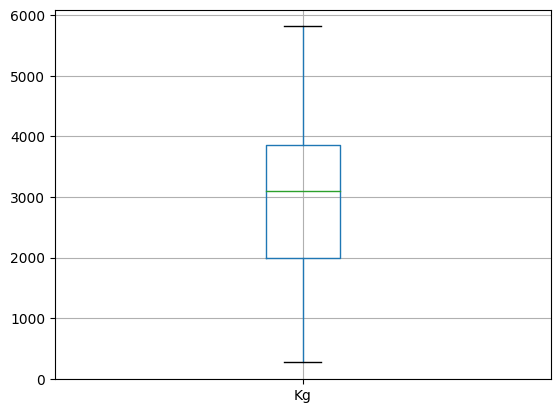

In [71]:
# Boxplot das cargas 
capacidade[["Kg"]].boxplot()
plt.show()

In [72]:
# Analise descriminativa das cargas
capacidade[["Kg"]].describe()

,Kg
count,136.000000
mean,2953.334853
std,1282.818824
min,268.040000
25%,1989.830000
50%,3092.195000
75%,3855.845000
max,5811.830000


In [73]:
# Categorização das cargas 

# Definindo as categorias de cargas
categorias = ['Intervalo de Carga [0-2000]', 'Intervalo de Carga [2000-4000]', 'Intervalo de Carga [4000-6000]']

# Definindo os limites de cada categoria
limites = [0,2000,4000,6000]

# Categorizando os resultados
capacidade["Categoria Carga(Kg)"]= pd.cut(capacidade["Kg"], bins=limites, labels=categorias)
capacidade[["Transporte","Categoria Carga(Kg)","Kg"]]

,Transporte,Categoria Carga(Kg),Kg
0,769710.0,Intervalo de Carga [2000-4000],2988.92
24,769709.0,Intervalo de Carga [2000-4000],3468.78
51,769713.0,Intervalo de Carga [4000-6000],4016.36
79,769711.0,Intervalo de Carga [4000-6000],4544.75
110,769712.0,Intervalo de Carga [2000-4000],3060.34
...,...,...,...
2599,769398.0,Intervalo de Carga [2000-4000],3903.28
2614,769397.0,Intervalo de Carga [4000-6000],4332.49
2642,769396.0,Intervalo de Carga [4000-6000],5783.86
2662,769395.0,Intervalo de Carga [2000-4000],3713.22


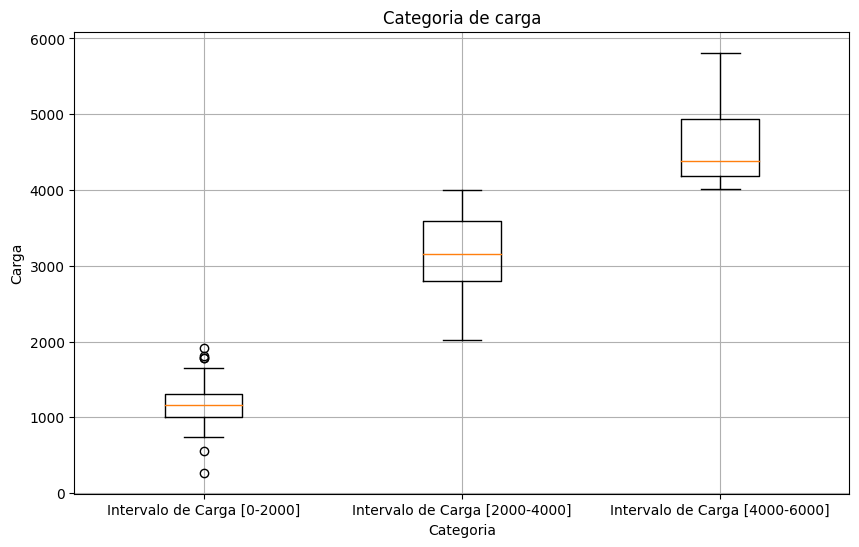

In [74]:
# Boxplot para a categorização de cargas
plt.figure(figsize=(10, 6))
cargas_por_categoria = []

for categoria in categorias:
    aux = capacidade[capacidade['Categoria Carga(Kg)'] == categoria]
    cargas_por_categoria.append(aux["Kg"])

plt.boxplot(cargas_por_categoria, labels=categorias)
plt.title('Categoria de carga')
plt.xlabel('Categoria')
plt.ylabel('Carga')
plt.grid(True)
plt.show()

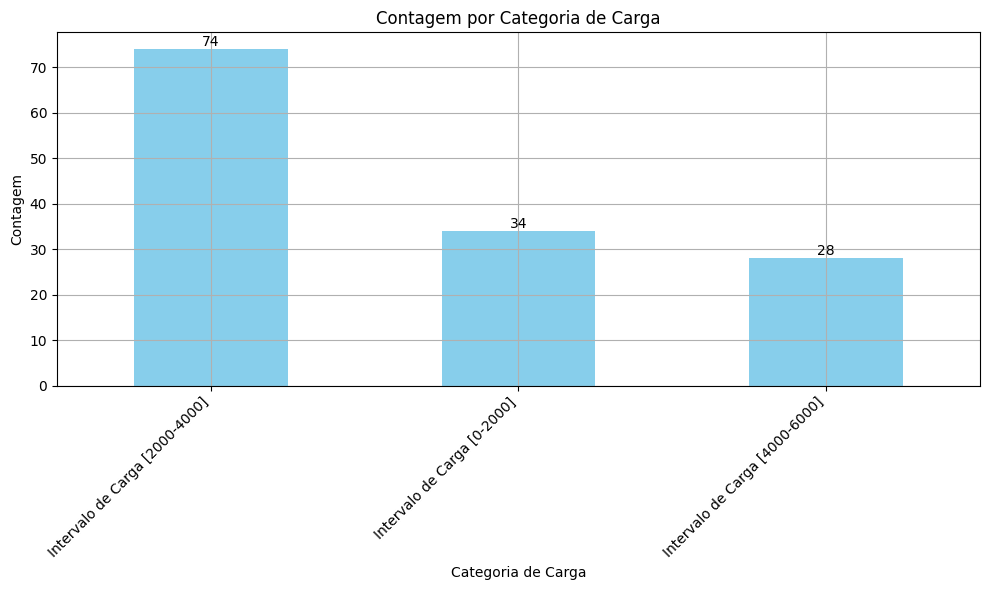

In [75]:
# Grafico de barras para as cargas

# Contar o número de ocorrências em cada categoria
contagem_por_categoria = capacidade['Categoria Carga(Kg)'].value_counts()

# Criar o gráfico de barras
plt.figure(figsize=(10, 6))
ax = contagem_por_categoria.plot(kind='bar', color='skyblue')

# Adicionar rótulos e título
plt.title('Contagem por Categoria de Carga')
plt.xlabel('Categoria de Carga')
plt.ylabel('Contagem')
plt.grid(True)

# Rotacionar os rótulos do eixo x para melhor legibilidade
plt.xticks(rotation=45, ha='right')

# Adicionar os valores absolutos no topo das barras
for i in ax.patches:
    ax.text(i.get_x() + i.get_width() / 2, i.get_height() + 0.1, str(i.get_height()), ha='center', va='bottom')

# Mostrar o gráfico
plt.tight_layout()
plt.show()

In [76]:
# Obtendo a contagem das caragas por rota em cada categoria
capacidade[["Categoria Carga(Kg)"]].value_counts()

Categoria Carga(Kg)           
Intervalo de Carga [2000-4000]    74
Intervalo de Carga [0-2000]       34
Intervalo de Carga [4000-6000]    28
dtype: int64

C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\3869605684.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_dados_rota.corr(method='spearman'),annot=True, fmt=".2f")


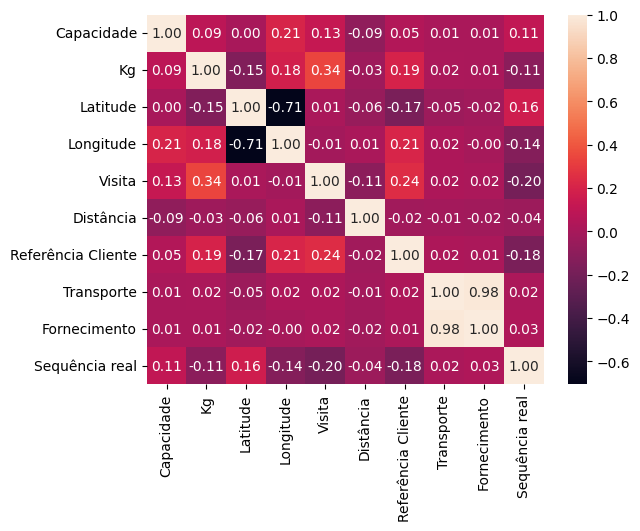

In [77]:
# Correlação entre as variáveis
sns.heatmap(df_dados_rota.corr(method='spearman'),annot=True, fmt=".2f")
plt.show()

In [78]:
# Nº total de entregas por horario

# Copiar o DataFrame original
aux = df_dados_rota.copy()

# Extrair a hora do campo 'Horário real de entrega'
aux['Hora'] = aux['Horário real de entrega'].apply(lambda x: str(x)).str.split(':').str[0]

# Contar as ocorrências de cada hora e ordenar pelo índice
hour_count = aux['Hora'].value_counts().sort_index()

# Converter a Series para DataFrame e renomear as colunas
hour_count_df = hour_count.reset_index()
hour_count_df.columns = ['Hora', 'Contagem']

# Mostrar o DataFrame com títulos das colunas
print(hour_count_df)


   Hora  Contagem
0    08        45
1    09       330
2    10       413
3    11       444
4    12       362
5    13       141
6    14       255
7    15       196
8    16        87
9    17        29
10   18        10
11   19         3
12  nan       387


In [79]:
# Nº total de entregas por horario e por rota
# Filtrar o dataset
aux = df_dados_rota.copy()
aux['Hora'] = aux['Horário real de entrega'].apply(lambda x: str(x)).str.split(':').str[0]

# Contar as ocorrências de cada hora por coluna de transporte
hour_transport_count = aux.groupby(['Hora', 'Transporte']).size().unstack(fill_value=0)

# Mostrar as ocorrências por hora e por coluna de transporte
print(hour_transport_count.transpose())

Hora        08  09  10  11  12  13  14  15  16  17  18  19  nan
Transporte                                                     
766218.0     0   0   1   2   2   2   2   0   0   0   0   0    2
766219.0     0   4   4   6   5   1   5   0   0   0   0   0    2
766220.0     0   1   3   4   4   1   4   0   0   0   0   0    2
766221.0     1   4   1   2   1   2   0   0   0   0   0   0    2
766222.0     1   2   4   7   4   0   3   1   0   0   0   0    2
...         ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ..  ...
771209.0     0   1   3   5   2   4   4   5   1   0   0   0    2
771210.0     1   2   3   4   0   0   2   2   2   0   0   0    2
771211.0     1   3   5   3   4   0   4   2   4   0   0   0    2
771212.0     0   0   1   3   4   0   0   1   0   0   0   0    2
771213.0     0   0   1   2   2   0   2   0   0   0   0   0    2

[136 rows x 13 columns]


In [80]:
# Matriz dos locais visitados normalizada

# Criar um DataFrame vazio com os locais únicos como índices e colunas
locais = df_dados_rota['Referência Cliente'].unique()
matriz_direcionada = pd.DataFrame(index=locais, columns=locais)

# Preencher os valores nulos (locais que não têm conexão direta) com zeros
matriz_direcionada = matriz_direcionada.fillna(0)

# Preencher a matriz direcionada com as distâncias do DataFrame
for i in range(len(df_dados_rota) - 1):
    if df_dados_rota.iloc[i]['Transporte'] == df_dados_rota.iloc[i+1]['Transporte']:
        origem = df_dados_rota.iloc[i]['Referência Cliente']
        proxima_visita = df_dados_rota.iloc[i + 1]['Referência Cliente']
        matriz_direcionada.loc[origem, proxima_visita] +=1

# Normalizar cada linha para que a soma seja igual a 1
matriz_direcionada = matriz_direcionada.div(matriz_direcionada.sum(axis=1), axis=0)

# Exibir a matriz direcionada
print(matriz_direcionada)


            NaN         21012087.0  21006784.0  11114246.0  11002692.0  \
NaN                0.0    0.007353    0.029412       0.000       0.000   
21012087.0         0.0    0.000000    0.375000       0.250       0.000   
21006784.0         0.0    0.250000    0.000000       0.125       0.000   
11114246.0         0.0    0.250000    0.000000       0.000       0.125   
11002692.0         0.0    0.000000    0.000000       0.000       0.000   
...                ...         ...         ...         ...         ...   
11048668.0         0.0    0.000000    0.000000       0.000       0.000   
11033142.0         0.0    0.000000    0.000000       0.000       0.000   
11066956.0         0.0    0.000000    0.000000       0.000       0.000   
11044958.0         0.0    0.000000    0.000000       0.000       0.000   
11049474.0         1.0    0.000000    0.000000       0.000       0.000   

            11056844.0  21009089.0  11111485.0  21012319.0  11068073.0  ...  \
NaN              0.000         0

In [81]:
# Top 20 da Matriz dos locais visitados diretamente

# Transformar a matriz em uma série e remover os pares de locais com frequência igual a 0
pares_frequentes = matriz_direcionada.stack()
pares_frequentes = pares_frequentes[pares_frequentes !=0]

pares_frequentes.sort_values(ascending=False).head(30)

11049474.0  NaN           1.0
21010520.0  21010509.0    1.0
21002718.0  NaN           1.0
21010509.0  21002718.0    1.0
11049614.0  11059724.0    1.0
11022654.0  11044652.0    1.0
11046440.0  11047793.0    1.0
11003810.0  11050114.0    1.0
11050114.0  11062917.0    1.0
11054996.0  11011793.0    1.0
11083426.0  11091595.0    1.0
21002719.0  21010520.0    1.0
11065302.0  11026850.0    1.0
11063155.0  11099775.0    1.0
11024583.0  11110158.0    1.0
11038360.0  11114718.0    1.0
11114777.0  11061130.0    1.0
11042448.0  11078235.0    1.0
11078235.0  11061770.0    1.0
11061770.0  11001072.0    1.0
11109131.0  11051522.0    1.0
11023869.0  11101775.0    1.0
11076439.0  11016217.0    1.0
11051433.0  21011234.0    1.0
21010792.0  11115094.0    1.0
11115094.0  11027781.0    1.0
11062564.0  NaN           1.0
11105957.0  11110051.0    1.0
21005615.0  11089340.0    1.0
11053589.0  11084911.0    1.0
dtype: float64

In [82]:
# Encontro entre pontos de uma rota indiretamente

encontros_por_par = {}

# Agrupar os dados por rota
dados_por_rota = df_dados_rota.groupby('Transporte')

# Iterar sobre cada rota
for rota, grupo in dados_por_rota:
# Criar um conjunto para armazenar os pares de pontos únicos
    pares_unicos = set()

    # Adicionar os pares de pontos únicos ao conjunto
    for par in combinations(grupo['Referência Cliente'], 2):
        pares_unicos.add(tuple(sorted(par)))  # Ordenar o par para evitar duplicatas

# Contar os encontros em cada par de pontos
    for par in pares_unicos:
        if par in encontros_por_par:
            encontros_por_par[par] += 1
        else:
            encontros_por_par[par] = 1

# Ordenar por ordem decrescente de encontros
dict(sorted(encontros_por_par.items(), key=lambda item: item[1], reverse=True))

{(21006078.0, 21010905.0): 8,
 (11114246.0, 21006784.0): 8,
 (11114246.0, 21012087.0): 8,
 (21006784.0, 21012087.0): 8,
 (11078442.0, 11099778.0): 7,
 (21002724.0, 21004645.0): 5,
 (21000240.0, 21007527.0): 5,
 (21002723.0, 21002724.0): 5,
 (21002723.0, 21004645.0): 5,
 (11063503.0, 11107782.0): 5,
 (11075618.0, 21006202.0): 5,
 (11107782.0, 21006202.0): 5,
 (11008574.0, 21006202.0): 5,
 (11075618.0, 11107782.0): 5,
 (11063503.0, 21006202.0): 5,
 (11063503.0, 11075936.0): 5,
 (11075936.0, 11107782.0): 5,
 (11075618.0, 11075936.0): 5,
 (11008574.0, 11075936.0): 5,
 (11075936.0, 21006202.0): 5,
 (11008574.0, 11063503.0): 5,
 (11008574.0, 11075618.0): 5,
 (11063503.0, 11075618.0): 5,
 (11008574.0, 11107782.0): 5,
 (11050776.0, 11108520.0): 5,
 (11050778.0, 11068901.0): 5,
 (11062255.0, 11087080.0): 5,
 (11050776.0, 11076226.0): 5,
 (11087080.0, 11108520.0): 5,
 (11062255.0, 11108520.0): 5,
 (11076226.0, 11087080.0): 5,
 (11050776.0, 11062255.0): 5,
 (11062255.0, 11076226.0): 5,
 (11076226

In [83]:
# Ratio entre os pontos visitados direta e indiretamente 
razoes = {}
for chave in pares_frequentes.to_dict():
    if chave in encontros_por_par:
        razoes[chave] = pares_frequentes[chave] / encontros_por_par[chave]
    else:
        # Se a chave não estiver presente em encontros_por_par, atribua None ou outro valor
        razoes[chave] = 0

# Ordena as chaves do dicionário de acordo com as razões em ordem decrescente
#sorted(razoes.items(), key=lambda x: x[1], reverse=True)[:100]
print(razoes.items())

dict_items([((nan, 21012087.0), 0), ((nan, 21006784.0), 0), ((nan, 21005824.0), 0), ((nan, 11083424.0), 0), ((nan, 21002914.0), 0), ((nan, 11066041.0), 0), ((nan, 21005257.0), 0), ((nan, 21006078.0), 0), ((nan, 21003161.0), 0), ((nan, 11078442.0), 0), ((nan, 11064671.0), 0), ((nan, 21003589.0), 0), ((nan, 21010020.0), 0), ((nan, 11087566.0), 0), ((nan, 11019102.0), 0), ((nan, 21001043.0), 0), ((nan, 21005904.0), 0), ((nan, 21004645.0), 0), ((nan, 21009922.0), 0), ((nan, 21002723.0), 0), ((nan, 21011090.0), 0), ((nan, 11076226.0), 0), ((nan, 11018878.0), 0), ((nan, 11008574.0), 0), ((nan, 11081624.0), 0), ((nan, 21009619.0), 0), ((nan, 21002717.0), 0), ((nan, 11082208.0), 0), ((nan, 11078588.0), 0), ((nan, 21005821.0), 0), ((nan, 11050401.0), 0), ((nan, 11114656.0), 0), ((nan, 21005941.0), 0), ((nan, 11113134.0), 0), ((nan, 11046003.0), 0), ((nan, 11099907.0), 0), ((nan, 11109901.0), 0), ((nan, 13002363.0), 0), ((nan, 11050918.0), 0), ((nan, 11114772.0), 0), ((nan, 11049764.0), 0), ((na

In [84]:
# As 1's paragens mais frequentes

pares_frequentes.sort_values(ascending=False).head(20)

11049474.0  NaN           1.0
21010520.0  21010509.0    1.0
21002718.0  NaN           1.0
21010509.0  21002718.0    1.0
11049614.0  11059724.0    1.0
11022654.0  11044652.0    1.0
11046440.0  11047793.0    1.0
11003810.0  11050114.0    1.0
11050114.0  11062917.0    1.0
11054996.0  11011793.0    1.0
11083426.0  11091595.0    1.0
21002719.0  21010520.0    1.0
11065302.0  11026850.0    1.0
11063155.0  11099775.0    1.0
11024583.0  11110158.0    1.0
11038360.0  11114718.0    1.0
11114777.0  11061130.0    1.0
11042448.0  11078235.0    1.0
11078235.0  11061770.0    1.0
11061770.0  11001072.0    1.0
dtype: float64

In [85]:
# Matriz dos locais visitados identificados por rota e matrícula

# Lista dos top 20 pares de locais mais frequentes
top_20_locais = pares_frequentes.index.tolist()

# Dicionário para armazenar rotas e matrículas de cada par de locais
info_por_par = {}

# Iterar sobre o DataFrame original para encontrar rotas e matrículas de cada par de locais
for idx, row in df_dados_rota.iterrows():
    origem = row['Referência Cliente']
    destino = df_dados_rota.loc[idx + 1, 'Referência Cliente'] if idx + 1 < len(df_dados_rota) else None
    
    # Verificar se o par de locais está presente nos top 20
    if (origem, destino) in top_20_locais:
        par = (origem, destino)
        if par not in info_por_par:
            info_por_par[par] = {'Rotas': [], 'Matrículas': []}
        
        # Adicionar rota e matrícula ao dicionário
        info_por_par[par]['Rotas'].append(row['Transporte'])
        info_por_par[par]['Matrículas'].append(row['Matrícula'])

# Exibir as rotas e matrículas para cada par de locais mais frequente
for par, info in info_por_par.items():
    rotas = info['Rotas']
    matriculas = info['Matrículas']
    print(f"Par de Locais: {par}, Rotas: {rotas}, Matrículas: {matriculas}")


Par de Locais: (21012087.0, 21006784.0), Rotas: [769710.0, 770971.0, 767911.0], Matrículas: ['09-PZ-62', '09-PZ-62', '09-PZ-62']
Par de Locais: (21006784.0, 11114246.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (11114246.0, 11002692.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (11002692.0, 11056844.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (11056844.0, 21009089.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (21009089.0, 11111485.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (11111485.0, 21012319.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (21012319.0, 11068073.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (11068073.0, 11065068.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (11065068.0, 11050917.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (11050917.0, 11031292.0), Rotas: [769710.0], Matrículas: ['09-PZ-62']
Par de Locais: (11031

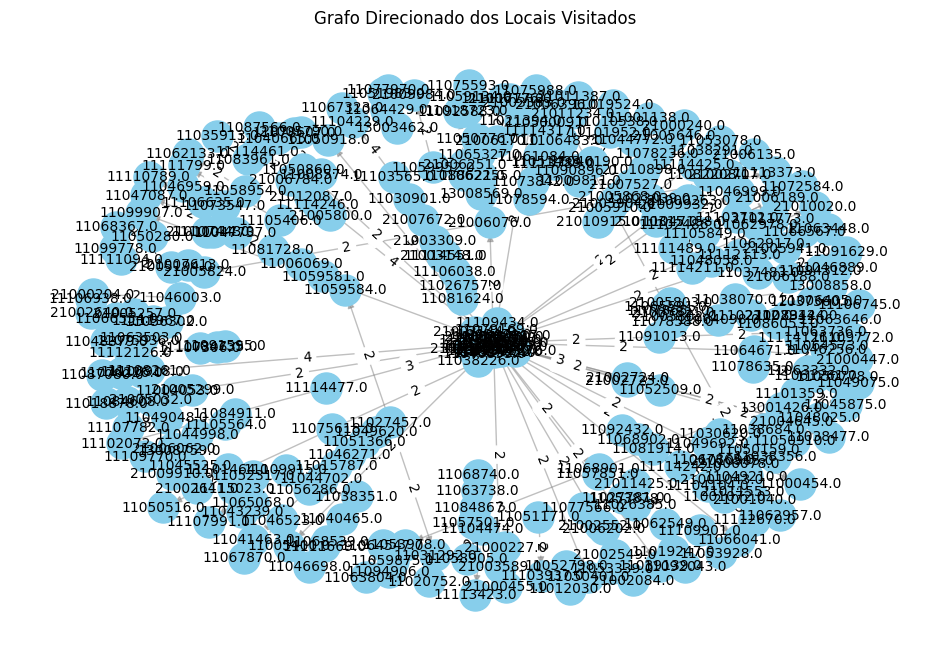

In [86]:
# Grafo dos locais visitados

# Criar um grafo direcionado
grafo_direcionado = nx.DiGraph()

# Substituir NaN por 0 nos locais
df_dados_rota['Referência Cliente'].fillna(0, inplace=True)

# Adicionar nós ao grafo com os locais únicos
locais = df_dados_rota['Referência Cliente'].unique()
grafo_direcionado.add_nodes_from(locais)

# Adicionar as arestas ponderadas com as distâncias do DataFrame
for i in range(len(df_dados_rota) - 1):
    if df_dados_rota.iloc[i]['Transporte'] == df_dados_rota.iloc[i+1]['Transporte']:
        origem = df_dados_rota.iloc[i]['Referência Cliente']
        proxima_visita = df_dados_rota.iloc[i + 1]['Referência Cliente']
        if grafo_direcionado.has_edge(origem, proxima_visita):
            grafo_direcionado[origem][proxima_visita]['weight'] += 1
        else:
            grafo_direcionado.add_edge(origem, proxima_visita, weight=1)

# Remover as arestas com peso menor ou igual a 1
edges_to_remove = [(origem, proxima_visita) for origem, proxima_visita, attrs in grafo_direcionado.edges(data=True) if attrs['weight'] <= 1]
grafo_direcionado.remove_edges_from(edges_to_remove)

# Remover nós sem ligações
isolated_nodes = [node for node, degree in dict(grafo_direcionado.degree()).items() if degree == 0]
grafo_direcionado.remove_nodes_from(isolated_nodes)

# Desenhar o grafo
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(grafo_direcionado)  # Posicionamento dos nós
nx.draw_networkx_nodes(grafo_direcionado, pos, node_size=500, node_color='skyblue')
nx.draw_networkx_edges(grafo_direcionado, pos, arrows=True, width=1.0, alpha=0.5, edge_color='gray')
nx.draw_networkx_labels(grafo_direcionado, pos, font_size=10, font_family='sans-serif')
labels = nx.get_edge_attributes(grafo_direcionado, 'weight')
nx.draw_networkx_edge_labels(grafo_direcionado, pos, edge_labels=labels)
plt.title('Grafo Direcionado dos Locais Visitados')
plt.axis('off')  # Desligar os eixos
plt.show()

In [87]:
# Dummy :)

# Function to calculate distance between two points
def calculate_distance(point1, point2):
    return geodesic((point1['Latitude'],point1['Longitude']),(point2['Latitude'],point2['Longitude'])).kilometers

# Initialize routes, distances, and transport IDs
all_routes = []
all_distances = []
all_transport_ids = []

# Group by 'id_transporte'
grouped = df_dados_rota.groupby('Transporte')

dummy = {}
# Iterate over groups
for group_name, group_data in grouped:
    # Initialize route with starting point as 'Partida' and ending point as 'Chegada'
    route = [group_data.loc[group_data['Tipo de visita'] == 'Partida', 'Referência Cliente'].iloc[0]]
    end_point = group_data.loc[group_data['Tipo de visita'] == 'Chegada', 'Referência Cliente'].iloc[0]

    # If there are no other points to visit, skip
    if len(group_data) <= 2:
        route.append(end_point)
        all_routes.append(route)
        all_distances.append(0)  # No distance traveled
        all_transport_ids.append(group_name)
        continue

    # Create a list of points to visit (excluding 'Partida' and 'Chegada')
    points_to_visit = list(group_data.loc[(group_data['Tipo de visita'] != 'Partida') & (group_data['Tipo de visita'] != 'Chegada'), 'Referência Cliente'])

    # Sort points to visit based on distance from the last point in the route
    while points_to_visit:
        last_point = group_data.loc[group_data['Referência Cliente'] == route[-1]].iloc[0]
        nearest_distance = float('inf')
        nearest_point = None
        for point in points_to_visit:
            distance = calculate_distance(last_point, group_data.loc[group_data['Referência Cliente'] == point].iloc[0])
            if distance < nearest_distance:
                nearest_distance = distance
                nearest_point = point
        route.append(nearest_point)
        points_to_visit.remove(nearest_point)

    # Ensure the last point in the route is 'Chegada'
    route.append(end_point)

    # Calculate total distance traveled in the route
    total_distance = 0
    for i in range(len(route) - 1):
        point1 = group_data.loc[group_data['Referência Cliente'] == route[i]].iloc[0]
        point2 = group_data.loc[group_data['Referência Cliente'] == route[i + 1]].iloc[0]
        total_distance += calculate_distance(point1, point2)

    all_routes.append(route)
    all_distances.append(total_distance)
    all_transport_ids.append(group_name)

# Print routes, distances, and transport IDs
for i, (route, distance, transport_id) in enumerate(zip(all_routes, all_distances, all_transport_ids), 1):
    route.pop()
    route.pop(0)
    dummy[transport_id] = route
    print(f"Transport ID: {transport_id},(Distance: {distance:.2f}), {route}")

Transport ID: 766218.0,(Distance: 224.89), [21009922.0, 21000240.0, 21007527.0, 21000246.0, 21001043.0, 21011899.0, 21004645.0, 21002723.0, 21002724.0]
Transport ID: 766219.0,(Distance: 81.24), [11025645.0, 11061261.0, 11049075.0, 11114477.0, 21005375.0, 11063503.0, 11048682.0, 11048379.0, 11008574.0, 11075936.0, 11018937.0, 11032070.0, 11081727.0, 11014138.0, 21006203.0, 21002549.0, 21002552.0, 21006202.0, 11086241.0, 11060294.0, 11075618.0, 11017632.0, 11049048.0, 11107782.0]
Transport ID: 766220.0,(Distance: 102.61), [11108520.0, 11076226.0, 11087080.0, 11075593.0, 11097354.0, 11050776.0, 11062255.0, 11064033.0, 11033857.0, 11057851.0, 11050778.0, 11086005.0, 11063332.0, 21007514.0, 11068901.0, 11053978.0, 11068073.0]
Transport ID: 766221.0,(Distance: 98.67), [11063736.0, 11020008.0, 11008232.0, 11064098.0, 11106745.0, 11066241.0, 21000263.0, 21009932.0, 21009559.0, 13008858.0, 13008569.0]
Transport ID: 766222.0,(Distance: 64.61), [21010905.0, 21006078.0, 11114656.0, 21009619.0, 110

In [88]:
# Matriz de distancias entre clientes de cada rota
from itertools import permutations
# Função para calcular a distância entre duas coordenadas geográficas
def calcular_distancia(coord1, coord2):
    return geodesic(coord1, coord2).kilometers

# Supondo que df_dados_rota já esteja definido, e fazemos o agrupamento por Transporte
dados_modelo = df_dados_rota[["Referência Cliente", "Latitude", "Longitude", "Capacidade", "Tipologia", "Kg", "Transporte", "Sequência real"]]
dados_modelo = dados_modelo.groupby("Transporte").apply(lambda x: x.dropna()).reset_index(drop=True)

# Agrupar por Transporte
grupos_transporte = dados_modelo.groupby("Transporte")

# Para armazenar as matrizes de distâncias por transporte
matrizes_distancias = {}

# Iterar sobre cada grupo de transporte
for transporte, grupo in grupos_transporte:
    # Gerar todas as combinações possíveis de pares de clientes
    combinacoes = list(permutations(grupo.index, 2))
    
    # Calcular a distância entre cada par de clientes
    distancias = []
    for (i, j) in combinacoes:
        coord1 = (grupo.at[i, "Latitude"], grupo.at[i, "Longitude"])
        coord2 = (grupo.at[j, "Latitude"], grupo.at[j, "Longitude"])
        distancia = calcular_distancia(coord1, coord2)
        distancias.append((grupo.at[i, "Referência Cliente"], grupo.at[j, "Referência Cliente"], distancia))
    
    # Criar DataFrame de distâncias
    df_distancias = pd.DataFrame(distancias, columns=["Cliente 1", "Cliente 2", "Distância"])
    
    # Adicionar à lista de matrizes de distâncias
    matrizes_distancias[transporte] = df_distancias

# Exibir as matrizes de distâncias para cada transporte
for transporte, df in matrizes_distancias.items():
    print(f"Matriz de Distâncias para rota de Transporte: {transporte}\n{df}\n")

Matriz de Distâncias para rota de Transporte: 766218.0
     Cliente 1   Cliente 2  Distância
0   21004645.0  21011899.0   0.733610
1   21004645.0  21009922.0  20.789998
2   21004645.0  21000246.0  20.544408
3   21004645.0  21007527.0  20.928730
4   21004645.0  21000240.0  20.784795
..         ...         ...        ...
67  21002724.0  21000246.0  34.216253
68  21002724.0  21007527.0  34.563955
69  21002724.0  21000240.0  34.408205
70  21002724.0  21001043.0  35.886567
71  21002724.0  21002723.0   0.181604

[72 rows x 3 columns]

Matriz de Distâncias para rota de Transporte: 766219.0
      Cliente 1   Cliente 2  Distância
0    11102072.0  21005375.0   4.336399
1    11102072.0  11075936.0   7.199525
2    11102072.0  11018937.0   7.103375
3    11102072.0  11063503.0   7.157970
4    11102072.0  11048682.0   7.431096
..          ...         ...        ...
595  11017632.0  11081727.0   6.165072
596  11017632.0  11014138.0   5.255412
597  11017632.0  11086241.0   3.531664
598  11017632.0  110

In [89]:
# Criação do novo dataframe com os atributos selecionados
nova = {}
for rota, df in matrizes_distancias.items():
    # Primeiro merge
    nova[rota] = pd.merge(df, dados_modelo[dados_modelo['Transporte'] == rota], 
                          left_on=['Cliente 1'], right_on=['Referência Cliente'], how='left')
    # Drop colunas desnecessárias
    nova[rota] = nova[rota].drop(['Referência Cliente', 'Transporte', 'Sequência real', 
                                  'Latitude', 'Longitude', 'Kg'], axis=1)
    
    # Segundo merge
    nova[rota] = pd.merge(nova[rota], dados_modelo[dados_modelo['Transporte'] == rota][['Kg', 'Referência Cliente']], 
                          left_on=['Cliente 2'], right_on=['Referência Cliente'], how='left')
    
    # Drop coluna desnecessária
    nova[rota] = nova[rota].drop(['Referência Cliente'], axis=1)

# Imprime de forma organizada
for rota, df in nova.items():
    print(f"Rota: {rota}")
    print(df.to_string(index=False))
    print("\n" + "="*40 + "\n")


Rota: 766218.0
 Cliente 1  Cliente 2  Distância  Capacidade Tipologia      Kg
21004645.0 21011899.0   0.733610      5500.0    Pesado  493.68
21004645.0 21009922.0  20.789998      5500.0    Pesado  345.54
21004645.0 21000246.0  20.544408      5500.0    Pesado  371.12
21004645.0 21007527.0  20.928730      5500.0    Pesado  517.38
21004645.0 21000240.0  20.784795      5500.0    Pesado 1262.41
21004645.0 21001043.0  22.241586      5500.0    Pesado   88.82
21004645.0 21002723.0  13.640636      5500.0    Pesado  303.32
21004645.0 21002724.0  13.739600      5500.0    Pesado  276.79
21011899.0 21004645.0   0.733610      5500.0    Pesado   87.49
21011899.0 21009922.0  20.649421      5500.0    Pesado  345.54
21011899.0 21000246.0  20.369563      5500.0    Pesado  371.12
21011899.0 21007527.0  20.775455      5500.0    Pesado  517.38
21011899.0 21000240.0  20.638074      5500.0    Pesado 1262.41
21011899.0 21001043.0  22.080837      5500.0    Pesado   88.82
21011899.0 21002723.0  13.941025      55

In [90]:
# Informaçao relevante em formato vetor

# Função para extrair os dados de cada linha do DataFrame original
def extrair_dados_linha(row):
    return row.tolist()

# Aplicar a função em cada linha do DataFrame original
dados_extraidos = df_dados_rota[["Referência Cliente","Latitude", "Longitude","Transporte","Sequência real"]].apply(extrair_dados_linha, axis=1)

# Agrupar os dados pelo transporte
dados_agrupados = dados_extraidos.groupby(df_dados_rota["Transporte"])

# Extrair os vetores separados
vetores = dados_agrupados.apply(list)

# Exibir todo o conteúdo dos vetores agrupados
for transporte, vetor in vetores.items():
    print(f"Transporte: {transporte}")
    for item in vetor:
        print(item)
    print("\n" + "="*40 + "\n")


Transporte: 766218.0
[0.0, 40.24435, -8.44365, 766218.0, nan]
[21004645.0, 39.659386, -7.668292, 766218.0, 8.0]
[21011899.0, 39.656772, -7.660441, 766218.0, 7.0]
[21009922.0, 39.812039, -7.527841, 766218.0, 1.0]
[21000246.0, 39.804931, -7.52031, 766218.0, 2.0]
[21007527.0, 39.811122, -7.52344, 766218.0, 4.0]
[21000240.0, 39.811071, -7.526197, 766218.0, 3.0]
[21001043.0, 39.819511, -7.512379, 766218.0, 6.0]
[21002723.0, 39.574101, -7.782636, 766218.0, 9.0]
[21002724.0, 39.572497, -7.782222, 766218.0, 10.0]
[0.0, 40.24435, -8.44365, 766218.0, nan]


Transporte: 766219.0
[0.0, 40.24435, -8.44365, 766219.0, nan]
[11102072.0, 40.525723, -8.599585, 766219.0, 33.0]
[21005375.0, 40.56347, -8.612702, 766219.0, 1.0]
[11075936.0, 40.5481617, -8.6793123, 766219.0, 16.0]
[11018937.0, 40.5464253, -8.6789158, 766219.0, 14.0]
[11063503.0, 40.5510032, -8.6773065, 766219.0, 17.0]
[11048682.0, 40.552988, -8.67969, 766219.0, 2.0]
[11048379.0, 40.553571, -8.681897, 766219.0, 3.0]
[11008574.0, 40.5552654, -

In [91]:
# Informaçao relevante para o Xt em formato vetor sem os nan
# Função para remover listas que contenham NaN
def remover_lista_nan(lista):
    return [sublista for sublista in lista if not any(pd.isna(valor) for valor in sublista)]

# Aplicar a função em cada lista interna de cada vetor
vetores_sem_nan = vetores.apply(lambda lista: remover_lista_nan(lista))

# Exibir os primeiros 5 elementos de cada vetor para verificar
print("Vetores das linhas do grupo 0 sem NaN:", vetores_sem_nan)


Vetores das linhas do grupo 0 sem NaN: Transporte
766218.0    [[21004645.0, 39.659386, -7.668292, 766218.0, ...
766219.0    [[11102072.0, 40.525723, -8.599585, 766219.0, ...
766220.0    [[11076226.0, 40.484916, -8.473722, 766220.0, ...
766221.0    [[11063736.0, 40.227476, -8.529563, 766221.0, ...
766222.0    [[11114656.0, 40.212193, -8.430955, 766222.0, ...
                                  ...                        
771209.0    [[11076226.0, 40.484916, -8.473722, 771209.0, ...
771210.0    [[21001806.0, 40.214442, -8.433477, 771210.0, ...
771211.0    [[21011463.0, 40.208852, -8.429084, 771211.0, ...
771212.0    [[21009922.0, 39.812039, -7.527841, 771212.0, ...
771213.0    [[21002723.0, 39.574101, -7.782636, 771213.0, ...
Length: 136, dtype: object


In [92]:
# Função para organizar a informação por ordem crescente de sequencia real
def criar_vetor_rotas(pontos):
    # Ordenar os pontos em ordem crescente com base na última coluna de cada linha
    pontos_ordenados = sorted(pontos, key=lambda x: x[-1], reverse=False)
    
    # Inicializar uma lista para armazenar os subconjuntos
    vetor_rotas = [[]]
    
    # Inicializar um conjunto para armazenar os pontos já incluídos
    pontos_incluidos = set()
    
    # Iterar sobre os pontos ordenados
    for ponto in pontos_ordenados:
        # Adicionar o ponto ao subconjunto se ele ainda não foi incluído
        if ponto[-1] not in pontos_incluidos:
            for i in vetor_rotas:
                i.append(ponto)
                pontos_incluidos.add(ponto[-1])
    return vetor_rotas[0]


# Criar subconjuntos crescentes
vetor_rotas = vetores_sem_nan.apply(criar_vetor_rotas)

# Exibir os subconjuntos crescentes resultantes
print(vetor_rotas[766218.0])

[[21009922.0, 39.812039, -7.527841, 766218.0, 1.0], [21000246.0, 39.804931, -7.52031, 766218.0, 2.0], [21000240.0, 39.811071, -7.526197, 766218.0, 3.0], [21007527.0, 39.811122, -7.52344, 766218.0, 4.0], [21001043.0, 39.819511, -7.512379, 766218.0, 6.0], [21011899.0, 39.656772, -7.660441, 766218.0, 7.0], [21004645.0, 39.659386, -7.668292, 766218.0, 8.0], [21002723.0, 39.574101, -7.782636, 766218.0, 9.0], [21002724.0, 39.572497, -7.782222, 766218.0, 10.0]]


In [93]:
# Adição do Target para verificar do ponto onde estás para onde tens que ir
def encontrar_proximo_indice(lista, elemento):
    """
    Encontra o índice de `elemento` na lista `lista`.
    Retorna -1 se o elemento não for encontrado.
    """
    index_map = {item[0]: idx for idx, item in enumerate(lista)}
    return index_map.get(elemento, -1)

def verificar_seguinte(cliente1, cliente2, rota):
    """
    Verifica se `cliente2` vem imediatamente após `cliente1` na lista `rota`.
    """
    pos1 = encontrar_proximo_indice(rota, cliente1)
    pos2 = encontrar_proximo_indice(rota, cliente2)
    return pos1 != -1 and pos2 == pos1 + 1

# Supondo que `nova` é um dicionário onde as chaves são identificadores de rota e os valores são DataFrames
for rota, df in nova.items():
    df['Target'] = df.apply(lambda row: verificar_seguinte(row['Cliente 1'], row['Cliente 2'], vetor_rotas[rota]), axis=1)

# Mostrar os DataFrames atualizados
for rota, df in nova.items():
    print(f"Rota de Transporte: {rota}")
    print(df.to_string())

Rota de Transporte: 766218.0
     Cliente 1   Cliente 2  Distância  Capacidade Tipologia       Kg  Target
0   21004645.0  21011899.0   0.733610      5500.0    Pesado   493.68   False
1   21004645.0  21009922.0  20.789998      5500.0    Pesado   345.54   False
2   21004645.0  21000246.0  20.544408      5500.0    Pesado   371.12   False
3   21004645.0  21007527.0  20.928730      5500.0    Pesado   517.38   False
4   21004645.0  21000240.0  20.784795      5500.0    Pesado  1262.41   False
5   21004645.0  21001043.0  22.241586      5500.0    Pesado    88.82   False
6   21004645.0  21002723.0  13.640636      5500.0    Pesado   303.32    True
7   21004645.0  21002724.0  13.739600      5500.0    Pesado   276.79   False
8   21011899.0  21004645.0   0.733610      5500.0    Pesado    87.49    True
9   21011899.0  21009922.0  20.649421      5500.0    Pesado   345.54   False
10  21011899.0  21000246.0  20.369563      5500.0    Pesado   371.12   False
11  21011899.0  21007527.0  20.775455      5500

In [94]:
# Dataframe final com remoção de rotas já visitadas
df_final = {}
# Função para verificar e remover linhas já visitadas na rota
def remove_visited_routes(df, rota):
    visited_pairs = set()
    
    # Gerar pares (Cliente1, Cliente2) da rota
    for i in range(len(rota)):
        for j in range(i + 1, len(rota)):
            cliente1 = rota[i][0]
            cliente2 = rota[j][0]
            visited_pairs.add((cliente1, cliente2))
    
    # Filtrar o DataFrame removendo as linhas com pares visitados
    mask = df.apply(lambda row: (row['Cliente 1'], row['Cliente 2']) in visited_pairs, axis=1)
    df_filtered = df[mask]
    
    return df_filtered

for rota, df in nova.items():
    # Aplicar a função e obter o DataFrame filtrado
    df_filtered = remove_visited_routes(df, vetor_rotas[rota])
    df_final[rota]= df_filtered
    print(f"DataFrame para rota {rota}:")
    print(df_filtered)

DataFrame para rota 766218.0:
     Cliente 1   Cliente 2  Distância  Capacidade Tipologia       Kg  Target
6   21004645.0  21002723.0  13.640636      5500.0    Pesado   303.32    True
7   21004645.0  21002724.0  13.739600      5500.0    Pesado   276.79   False
8   21011899.0  21004645.0   0.733610      5500.0    Pesado    87.49    True
14  21011899.0  21002723.0  13.941025      5500.0    Pesado   303.32   False
15  21011899.0  21002724.0  14.032492      5500.0    Pesado   276.79   False
16  21009922.0  21004645.0  20.789998      5500.0    Pesado    87.49   False
17  21009922.0  21011899.0  20.649421      5500.0    Pesado   493.68   False
18  21009922.0  21000246.0   1.019185      5500.0    Pesado   371.12    True
19  21009922.0  21007527.0   0.390361      5500.0    Pesado   517.38   False
20  21009922.0  21000240.0   0.177111      5500.0    Pesado  1262.41   False
21  21009922.0  21001043.0   1.562367      5500.0    Pesado    88.82   False
22  21009922.0  21002723.0  34.286271      550

DataFrame para rota 766222.0:
      Cliente 1   Cliente 2  Distância  Capacidade Tipologia      Kg  Target
3    11114656.0  11026757.0   6.239366      5500.0    Pesado   43.90   False
4    11114656.0  11114232.0   7.003843      5500.0    Pesado  210.61   False
5    11114656.0  21011940.0   7.003843      5500.0    Pesado  165.70   False
6    11114656.0  21003148.0   7.003843      5500.0    Pesado   72.08   False
7    11114656.0  11114551.0   7.003843      5500.0    Pesado   22.96   False
..          ...         ...        ...         ...       ...     ...     ...
456  21005032.0  11018915.0  17.908171      5500.0    Pesado   85.37   False
457  21005032.0  11021893.0  17.835459      5500.0    Pesado  103.44   False
458  21005032.0  11047698.0  17.906158      5500.0    Pesado  157.35   False
459  21005032.0  11090896.0   9.075255      5500.0    Pesado   44.62   False
460  21005032.0  11019524.0   8.309057      5500.0    Pesado  149.46   False

[231 rows x 7 columns]
DataFrame para rota 76

In [95]:
# Modelação 
# 80% das rotas
print(round(len(df_final)*0.8))
print(round(len(df_final)*0.6))
rotas = list(vetor_rotas.keys())
df_train = [df_final[rota] for rota in rotas][:82]
df_val = [df_final[rota] for rota in rotas][82:109]
df_test = [df_final[rota] for rota in rotas][109:]


109
82


In [96]:
# Separação teste e treino

df_train_merge = pd.concat(df_train, axis=0) 
df_val_merge = pd.concat(df_val, axis=0) 
df_test_merge = pd.concat(df_test, axis=0) 

y_train = df_train_merge[['Target']]
y_val = df_val_merge[['Target']]
y_test = df_test_merge[['Target']]

x_train = df_train_merge.drop(columns=['Target'])
x_val = df_val_merge.drop(columns=['Target'])
x_test = df_test_merge.drop(columns=['Target'])

label_encoder = LabelEncoder()
x_train['Tipologia'] = label_encoder.fit_transform(x_train['Tipologia'])
x_val['Tipologia'] = label_encoder.transform(x_val['Tipologia'])
x_test['Tipologia'] = label_encoder.transform(x_test['Tipologia'])

In [97]:
# Treino e teste do modelo 
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

dt = DecisionTreeClassifier(random_state=100).fit(x_train,y_train)
y_pred = dt.predict(x_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

       False       0.92      0.88      0.90      4039
        True       0.20      0.27      0.23       423

    accuracy                           0.83      4462
   macro avg       0.56      0.58      0.56      4462
weighted avg       0.85      0.83      0.84      4462



In [98]:
# Treino e teste do modelo 
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

lr = LogisticRegression(random_state=100).fit(x_train,y_train)
y_pred = lr.predict(x_val)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

       False       0.91      1.00      0.95      4039
        True       0.00      0.00      0.00       423

    accuracy                           0.91      4462
   macro avg       0.45      0.50      0.48      4462
weighted avg       0.82      0.91      0.86      4462



c:\Users\ajnso\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\ajnso\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ajnso\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ajnso

In [99]:
# Treino e teste do modelo 
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=100).fit(x_train,y_train)
y_pred = rf.predict(x_val)
print(classification_report(y_val, y_pred))

C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\3699225140.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf = RandomForestClassifier(random_state=100).fit(x_train,y_train)


              precision    recall  f1-score   support

       False       0.92      0.98      0.95      4039
        True       0.44      0.13      0.21       423

    accuracy                           0.90      4462
   macro avg       0.68      0.56      0.58      4462
weighted avg       0.87      0.90      0.88      4462



In [100]:
# Treino e teste do modelo 
from sklearn.ensemble import AdaBoostClassifier

ad = AdaBoostClassifier(random_state=100).fit(x_train,y_train)
y_pred = ad.predict(x_val)
print(classification_report(y_val, y_pred))

c:\Users\ajnso\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

       False       0.91      1.00      0.95      4039
        True       0.22      0.01      0.02       423

    accuracy                           0.90      4462
   macro avg       0.56      0.50      0.48      4462
weighted avg       0.84      0.90      0.86      4462



In [101]:
# Treino e teste do modelo 
from sklearn.ensemble import GradientBoostingClassifier

gb = GradientBoostingClassifier(random_state=100).fit(x_train,y_train)
y_pred = gb.predict(x_val)
print(classification_report(y_val, y_pred))

c:\Users\ajnso\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

       False       0.91      0.99      0.95      4039
        True       0.41      0.05      0.08       423

    accuracy                           0.90      4462
   macro avg       0.66      0.52      0.52      4462
weighted avg       0.86      0.90      0.87      4462



In [102]:
# Treino e teste do modelo 
from sklearn.ensemble import HistGradientBoostingClassifier

hgb = HistGradientBoostingClassifier(random_state=100).fit(x_train,y_train)
y_pred = hgb.predict(x_val)
print(classification_report(y_val, y_pred))

c:\Users\ajnso\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


              precision    recall  f1-score   support

       False       0.91      1.00      0.95      4039
        True       0.55      0.03      0.05       423

    accuracy                           0.91      4462
   macro avg       0.73      0.51      0.50      4462
weighted avg       0.87      0.91      0.87      4462



In [103]:
# Treino e teste do modelo 
import xgboost as xgb
from sklearn.preprocessing import OrdinalEncoder

# Encode y to numeric
encoder = OrdinalEncoder().fit(np.array(y_train).reshape(-1,1))
y_train_encoded = encoder.transform(np.array(y_train).reshape(-1,1))
y_val_encoded = encoder.transform(np.array(y_val).reshape(-1,1))
y_test_encoded = encoder.transform(np.array(y_test).reshape(-1,1))

x = xgb.XGBClassifier(random_state=100).fit(x_train,y_train_encoded)
y_pred = x.predict(x_val)
print(classification_report(y_val_encoded, y_pred))

              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95      4039
         1.0       0.40      0.15      0.22       423

    accuracy                           0.90      4462
   macro avg       0.66      0.56      0.58      4462
weighted avg       0.87      0.90      0.88      4462



In [104]:
# Treino e teste do modelo 
import lightgbm as lgb

l = lgb.LGBMClassifier(random_state=100, force_row_wise = True, verbose=-1).fit(x_train,y_train)
y_pred = l.predict(x_val)
print(classification_report(y_val, y_pred))

c:\Users\ajnso\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_label.py:99: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\Users\ajnso\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_label.py:134: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


              precision    recall  f1-score   support

       False       0.91      0.99      0.95      4039
        True       0.47      0.07      0.12       423

    accuracy                           0.90      4462
   macro avg       0.69      0.53      0.53      4462
weighted avg       0.87      0.90      0.87      4462



In [105]:
# Função com informação do armazem
def informacao_armazem(rota):
    condicao = (df_dados_rota['Tipo de visita'] == 'Partida') & (df_dados_rota['Transporte'] == rota)
    resultado = df_dados_rota.loc[condicao][['Latitude','Longitude','Capacidade', 'Tipologia', 'Kg']].to_dict()
    index = [int(key) for key in resultado['Latitude'].keys()][0]

    converted_data = {
    'Latitude': resultado['Latitude'][index],
    'Longitude': resultado['Longitude'][index],
    'Capacidade': resultado['Capacidade'][index],
    'Tipologia': label_encoder.transform([resultado['Tipologia'][index]])[0],
    'Kg': resultado['Kg'][index]
}
    
    return converted_data

In [106]:
# Função com informação do cliente
def informacao_cliente(rota,cliente):
    condicao = (df_dados_rota['Referência Cliente'] == cliente) & (df_dados_rota['Transporte'] == rota)
    resultado = df_dados_rota.loc[condicao][['Latitude','Longitude','Capacidade', 'Tipologia', 'Kg']].to_dict()
    index = [int(key) for key in resultado['Latitude'].keys()][0]

    converted_data = {
    'Latitude': resultado['Latitude'][index],
    'Longitude': resultado['Longitude'][index],
    'Capacidade': resultado['Capacidade'][index],
    'Tipologia': label_encoder.transform([resultado['Tipologia'][index]])[0],
    'Kg': resultado['Kg'][index]
}
    
    return converted_data

In [107]:
# Algoritmo para criação de rotas (OSquare)
previsoes = {}
for rota in rotas[109:]:
    clientes = [cliente for cliente in vetor_rotas[rota]]
    if len(clientes) <= 1:
        print(rota)
        continue
    rota_prevista = [0]
    for ponto_visitado in rota_prevista:
        if ponto_visitado == 0:
           armazem = informacao_armazem(rota)
           new_rows = [{'Cliente 1': ponto_visitado, 'Cliente 2': i[0], 'Distância': calcular_distancia((armazem['Latitude'],armazem['Longitude']),(i[1],i[2])), 
                     'Capacidade': armazem['Capacidade'] , 'Tipologia': armazem['Tipologia'], 'Kg': armazem['Kg']} for i in clientes]
        else:
            new_rows = []
            for i in clientes:
                distancia = matrizes_distancias[rota][(matrizes_distancias[rota]['Cliente 1'] == ponto_visitado) 
                                                     & (matrizes_distancias[rota]['Cliente 2'] == i[0])]['Distância']
                info_cliente = informacao_cliente(rota, i[0])
                new_rows.append({'Cliente 1': ponto_visitado, 'Cliente 2': i[0], 'Distância': float(distancia), 
                         'Capacidade': info_cliente['Capacidade'] , 'Tipologia': info_cliente['Tipologia'], 'Kg': info_cliente['Kg']})

        df = pd.DataFrame(new_rows)
        y_pred = rf.predict_proba(df)[:,1]
        indice_seguinte = np.argmax(y_pred)
        indices_max_pred = np.where(y_pred == y_pred[indice_seguinte])[0].tolist()

        if len(indices_max_pred) > 1:
            # Em caso de empate usar a distancia
            min_distance = np.inf
            indice_seguinte = -1
            for idx in indices_max_pred:
                if df.loc[idx, 'Distância'] < min_distance:
                    min_distance = df.loc[idx, 'Distância']
                    indice_seguinte = idx
        else:
            indice_seguinte = indices_max_pred[0]

        rota_prevista.append(clientes[indice_seguinte][0])
        clientes.remove(clientes[indice_seguinte])

        if  not clientes:
            previsoes[rota] = rota_prevista[1:]
            print("Rota: ", rota,"Previsão: ", previsoes[rota])
            print("Rota Original: ", [cliente[0] for cliente in vetor_rotas[rota]])
            break

Rota:  770190.0 Previsão:  [21005941.0, 11109915.0, 21009984.0, 11107991.0, 11059952.0, 11068622.0, 11092588.0, 11074456.0, 11019417.0, 11114656.0, 11049439.0, 11050401.0, 11111728.0]
Rota Original:  [21005941.0, 11111728.0, 11109915.0, 21009984.0, 11107991.0, 11059952.0, 11068622.0, 11019417.0, 11074456.0, 11114656.0, 11092588.0, 11049439.0, 11050401.0]
Rota:  770191.0 Previsão:  [21005032.0, 11087566.0, 11056038.0, 11106745.0, 11113733.0, 11019102.0, 11110051.0, 11105957.0, 11061828.0, 11050860.0, 11056302.0]
Rota Original:  [11050860.0, 11087566.0, 11106745.0, 11056038.0, 11110051.0, 11105957.0, 11061828.0, 11019102.0, 21005032.0, 11056302.0, 11113733.0]
Rota:  770425.0 Previsão:  [21000849.0, 11004053.0, 21005589.0, 11099622.0, 11049605.0, 21011755.0, 11077278.0, 11111669.0, 11063448.0, 11028129.0, 21000211.0, 11068539.0, 11063646.0, 11026850.0, 11063162.0, 11113878.0, 11046283.0, 11063503.0, 11064598.0, 11067157.0, 11049381.0, 11073934.0, 11031771.0, 11076227.0]
Rota Original:  [1

In [108]:
# Transformação para criar um dicionário onde a chave é o índice da rota e o valor é uma lista de nomes de clientes (dummy)
clientes_por_rota = {}
for index, rota in vetor_rotas.items():
    clientes_por_rota[index] = [cliente[0] for cliente in rota]

In [109]:
# Avaliação de métricas 
# Kendall Correlation
from scipy.stats import kendalltau

# Função para calcular a correlação de Kendall para todos os pares de rotas
def calculate_kendall_correlation(y_pred, y_true):
    correlations = {}
    for key in y_pred.keys():
        if key in y_true:
            tau, _ = kendalltau(y_pred[key], y_true[key])
            correlations[key] = tau
    return correlations

In [110]:
# Calcular a correlação de Kendall
kendall_correlations = calculate_kendall_correlation(previsoes, clientes_por_rota)
print(kendall_correlations)
print(sum(list(kendall_correlations.values())) / len(list(kendall_correlations.values())))
print(np.std(list(kendall_correlations.values())))

{770190.0: 0.30769230769230765, 770191.0: -0.2, 770425.0: -0.13043478260869565, 770426.0: -0.043478260869565216, 770427.0: 0.2648221343873518, 770428.0: -0.032679738562091505, 770429.0: -0.045751633986928116, 770430.0: 0.10294117647058822, 770692.0: -0.1176470588235294, 770693.0: -0.27485380116959063, 770694.0: 0.4444444444444444, 770695.0: -0.15032679738562094, 770697.0: -0.3571428571428571, 770698.0: 0.6, 770970.0: -0.010526315789473684, 770971.0: 0.0, 770972.0: -0.03225806451612904, 770973.0: 0.12380952380952383, 770974.0: -0.2121212121212121, 770976.0: 0.20289855072463767, 771208.0: 0.2123076923076923, 771209.0: 0.019999999999999993, 771210.0: -0.016666666666666666, 771211.0: 0.027692307692307693, 771212.0: -0.2777777777777778, 771213.0: 0.6190476190476191}
0.03938426112139749
0.24835972572988355


In [111]:
# Avaliação de métricas 
# Edit Distance

import Levenshtein

# Função para criar um mapeamento de IDs para strings
def create_id_mapping(ids):
    unique_ids = sorted(set(ids))
    return {id_: f"ID{id_}" for id_ in unique_ids}

# Função para converter uma lista de IDs em uma string usando o mapeamento
def ids_to_string(ids, mapping):
    return ''.join(mapping.get(id_, 'UNKNOWN') for id_ in ids)

# Função para calcular a distância de edição para todos os pares de rotas
def calculate_edit_distance_from_ids(y_pred, y_true):
    all_ids = set(id_ for ids in y_pred.values() for id_ in ids) | set(id_ for ids in y_true.values() for id_ in ids)
    mapping = create_id_mapping(all_ids)
    
    distances = {}
    for key in y_pred.keys():
        if key in y_true:
            pred_ids = y_pred[key]
            true_ids = y_true[key]
            
            # Converter IDs para strings usando o mapeamento
            pred_str = ids_to_string(pred_ids, mapping)
            true_str = ids_to_string(true_ids, mapping)
            
            # Calcular a distância de edição
            distance = Levenshtein.distance(pred_str, true_str)
            distances[key] = distance
    return distances


In [112]:
# Calcular Edit Distance
edit_distances = calculate_edit_distance_from_ids(previsoes, clientes_por_rota)
print(edit_distances)
print(sum(list(edit_distances.values())) / len(list(edit_distances.values())))
print(np.std(list(edit_distances.values())))

{770190.0: 40, 770191.0: 51, 770425.0: 116, 770426.0: 117, 770427.0: 102, 770428.0: 85, 770429.0: 76, 770430.0: 68, 770692.0: 90, 770693.0: 85, 770694.0: 38, 770695.0: 53, 770697.0: 43, 770698.0: 38, 770970.0: 101, 770971.0: 111, 770972.0: 135, 770973.0: 94, 770974.0: 61, 770976.0: 95, 771208.0: 111, 771209.0: 116, 771210.0: 80, 771211.0: 121, 771212.0: 31, 771213.0: 10}
79.53846153846153
32.79801913487456


In [113]:
# Avaliação de métricas 
# Accuracy

def calculate_accuracy(y_pred, y_true):
    accuracies = {}
    for key in y_pred.keys():
        if key in y_true:
            pred_list = y_pred[key]
            true_list = y_true[key]
            
            # Garantir que as listas são do mesmo tamanho
            if len(pred_list) != len(true_list):
                raise ValueError(f"As listas para {key} têm tamanhos diferentes.")
            
            # Calcular a quantidade de correspondências
            correct_predictions = sum(p == t for p, t in zip(pred_list, true_list))
            accuracy = correct_predictions / len(true_list)
            accuracies[key] = accuracy
    return accuracies


In [114]:
# Calcular a acurácia
accuracies = calculate_accuracy(previsoes, clientes_por_rota)
print(accuracies)
print(sum(list(accuracies.values())) / len(list(accuracies.values())))
print(np.std(list(accuracies.values())))

{770190.0: 0.15384615384615385, 770191.0: 0.09090909090909091, 770425.0: 0.041666666666666664, 770426.0: 0.041666666666666664, 770427.0: 0.08695652173913043, 770428.0: 0.0, 770429.0: 0.1111111111111111, 770430.0: 0.11764705882352941, 770692.0: 0.0, 770693.0: 0.0, 770694.0: 0.2222222222222222, 770695.0: 0.3333333333333333, 770697.0: 0.0, 770698.0: 0.1, 770970.0: 0.05, 770971.0: 0.0, 770972.0: 0.06451612903225806, 770973.0: 0.0, 770974.0: 0.0, 770976.0: 0.125, 771208.0: 0.0, 771209.0: 0.0, 771210.0: 0.0, 771211.0: 0.07692307692307693, 771212.0: 0.1111111111111111, 771213.0: 0.42857142857142855}
0.0829030988829146
0.10472945319609907


In [115]:
# Avaliação métricas dummy

# Calcular a correlação de Kendall

# Filtra as rotas para remover aquelas que têm apenas um elemento na lista correspondente
filtered_rotas = [rota for rota in rotas[109:]]

# Cria o dicionário a partir das rotas filtradas
dummy_test = {rota: dummy[rota] for rota in filtered_rotas}

del(dummy_test[770975.0])
kendall_correlations = calculate_kendall_correlation(dummy_test, clientes_por_rota)
print(kendall_correlations)
print(sum(list(kendall_correlations.values())) / len(list(kendall_correlations.values())))
print(np.std(list(kendall_correlations.values())))

{770190.0: 0.0, 770191.0: 0.5272727272727272, 770425.0: -0.057971014492753624, 770426.0: -0.42028985507246375, 770427.0: -0.011857707509881422, 770428.0: 0.22875816993464054, 770429.0: 0.17647058823529413, 770430.0: 0.014705882352941175, 770692.0: -0.3235294117647059, 770693.0: -0.18128654970760236, 770694.0: -0.1111111111111111, 770695.0: 0.019607843137254905, 770697.0: -0.14285714285714285, 770698.0: 0.06666666666666667, 770970.0: -0.16842105263157894, 770971.0: 0.028985507246376812, 770972.0: 0.14408602150537636, 770973.0: 0.08571428571428572, 770974.0: 0.0, 770976.0: 0.13768115942028986, 771208.0: -0.003076923076923077, 771209.0: 0.09999999999999998, 771210.0: -0.08333333333333334, 771211.0: 0.23692307692307696, 771212.0: 0.2777777777777778, 771213.0: -0.23809523809523814}
0.011646937174383604
0.19578713025596597


In [116]:
# Avaliação métricas dummy

# Edit Distance

import Levenshtein

# Função para criar um mapeamento de IDs para strings
def create_id_mapping(ids):
    unique_ids = sorted(set(ids))
    return {id_: f"ID{id_}" for id_ in unique_ids}

# Função para converter uma lista de IDs em uma string usando o mapeamento
def ids_to_string(ids, mapping):
    return ''.join(mapping.get(id_, 'UNKNOWN') for id_ in ids)

# Função para calcular a distância de edição para todos os pares de rotas
def calculate_edit_distance_from_ids(y_pred, y_true):
    all_ids = set(id_ for ids in y_pred.values() for id_ in ids) | set(id_ for ids in y_true.values() for id_ in ids)
    mapping = create_id_mapping(all_ids)
    
    distances = {}
    for key in y_pred.keys():
        if key in y_true:
            pred_ids = y_pred[key]
            true_ids = y_true[key]
            
            # Converter IDs para strings usando o mapeamento
            pred_str = ids_to_string(pred_ids, mapping)
            true_str = ids_to_string(true_ids, mapping)
            
            # Calcular a distância de edição
            distance = Levenshtein.distance(pred_str, true_str)
            distances[key] = distance
    return distances

# Calcular a distância de edição
edit_distances = calculate_edit_distance_from_ids(dummy_test, clientes_por_rota)
print(edit_distances)
print(sum(list(edit_distances.values())) / len(list(edit_distances.values())))
print(np.std(list(edit_distances.values())))

{770190.0: 65, 770191.0: 34, 770425.0: 118, 770426.0: 109, 770427.0: 99, 770428.0: 72, 770429.0: 68, 770430.0: 65, 770692.0: 80, 770693.0: 78, 770694.0: 46, 770695.0: 78, 770697.0: 46, 770698.0: 42, 770970.0: 100, 770971.0: 109, 770972.0: 130, 770973.0: 100, 770974.0: 44, 770976.0: 97, 771208.0: 111, 771209.0: 115, 771210.0: 68, 771211.0: 115, 771212.0: 27, 771213.0: 26}
78.53846153846153
30.467171196388733


In [117]:
# Avaliação de métricas dummy
# Accuracy

def calculate_accuracy(y_pred, y_true):
    accuracies = {}
    for key in y_pred.keys():
        if key in y_true:
            pred_list = y_pred[key]
            true_list = y_true[key]
            
            # Garantir que as listas são do mesmo tamanho
            if len(pred_list) != len(true_list):
                raise ValueError(f"As listas para {key} têm tamanhos diferentes.")
            
            # Calcular a quantidade de correspondências
            correct_predictions = sum(p == t for p, t in zip(pred_list, true_list))
            accuracy = correct_predictions / len(true_list)
            accuracies[key] = accuracy
    return accuracies

# Calcular a acurácia
accuracies = calculate_accuracy(dummy_test, clientes_por_rota)
print(accuracies)
print(sum(list(accuracies.values())) / len(list(accuracies.values())))
print(np.std(list(accuracies.values())))

{770190.0: 0.0, 770191.0: 0.45454545454545453, 770425.0: 0.0, 770426.0: 0.08333333333333333, 770427.0: 0.13043478260869565, 770428.0: 0.1111111111111111, 770429.0: 0.1111111111111111, 770430.0: 0.23529411764705882, 770692.0: 0.0, 770693.0: 0.10526315789473684, 770694.0: 0.0, 770695.0: 0.1111111111111111, 770697.0: 0.0, 770698.0: 0.2, 770970.0: 0.0, 770971.0: 0.0, 770972.0: 0.12903225806451613, 770973.0: 0.047619047619047616, 770974.0: 0.16666666666666666, 770976.0: 0.16666666666666666, 771208.0: 0.0, 771209.0: 0.0, 771210.0: 0.0, 771211.0: 0.11538461538461539, 771212.0: 0.2222222222222222, 771213.0: 0.0}
0.09191521753793644
0.10589547263719715


In [118]:
# Experiência adição do atributo Frequência 

# "Meltando" a matriz de distâncias para obter um DataFrame long
df2_melted = matriz_direcionada.reset_index().melt(id_vars='index')
df2_melted.columns = ['Cliente 1', 'Cliente 2', 'Frequência']

# Merge dos dataframes
x_train_exp = x_train.merge(df2_melted, on=['Cliente 1', 'Cliente 2'], how='left')

# Merge dos dataframes
x_val_exp = x_val.merge(df2_melted, on=['Cliente 1', 'Cliente 2'], how='left')

# Merge dos dataframes
x_test_exp = x_test.merge(df2_melted, on=['Cliente 1', 'Cliente 2'], how='left')



In [119]:
# Treino e teste do modelo 
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=100).fit(x_train_exp,y_train)
y_pred = rf.predict(x_val_exp)
print(classification_report(y_val, y_pred))

C:\Users\ajnso\AppData\Local\Temp\ipykernel_6872\2869311935.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf = RandomForestClassifier(random_state=100).fit(x_train_exp,y_train)


              precision    recall  f1-score   support

       False       0.92      0.98      0.95      4039
        True       0.51      0.17      0.26       423

    accuracy                           0.91      4462
   macro avg       0.71      0.58      0.60      4462
weighted avg       0.88      0.91      0.88      4462



In [120]:
# Treino e teste do modelo 
import xgboost as xgb
from sklearn.preprocessing import OrdinalEncoder

# Encode y to numeric
encoder = OrdinalEncoder().fit(np.array(y_train).reshape(-1,1))
y_train_encoded = encoder.transform(np.array(y_train).reshape(-1,1))
y_val_encoded = encoder.transform(np.array(y_val).reshape(-1,1))
y_test_encoded = encoder.transform(np.array(y_test).reshape(-1,1))

# Converter colunas categóricas para o tipo category
for col in x_train_exp.columns:
    if x_train_exp[col].dtype == 'object':
        x_train_exp[col] = x_train_exp[col].astype('category')
        x_val_exp[col] = x_val_exp[col].astype('category')
        x_test_exp[col] = x_test_exp[col].astype('category')

x = xgb.XGBClassifier(random_state=100,enable_categorical=True).fit(x_train_exp,y_train_encoded)
y_pred = x.predict(x_val_exp)
print(classification_report(y_val_encoded, y_pred))

              precision    recall  f1-score   support

         0.0       0.93      0.93      0.93      4039
         1.0       0.30      0.28      0.29       423

    accuracy                           0.87      4462
   macro avg       0.61      0.61      0.61      4462
weighted avg       0.87      0.87      0.87      4462



In [121]:
# Treino e teste do modelo 
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

dt = DecisionTreeClassifier(random_state=100).fit(x_train_exp,y_train)
y_pred = dt.predict(x_val_exp)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

       False       0.93      0.88      0.90      4039
        True       0.22      0.32      0.26       423

    accuracy                           0.83      4462
   macro avg       0.57      0.60      0.58      4462
weighted avg       0.86      0.83      0.84      4462



In [122]:
# Experiência Hypertunning xgboost
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score

# Encode y to numeric
encoder = OrdinalEncoder().fit(np.array(y_train).reshape(-1,1))
y_train_encoded = encoder.transform(np.array(y_train).reshape(-1,1))
y_val_encoded = encoder.transform(np.array(y_val).reshape(-1,1))
y_test_encoded = encoder.transform(np.array(y_test).reshape(-1,1))

# Inicializar o modelo XGBoost
xgb_model = xgb.XGBClassifier(random_state=100,enable_categorical=True)

# Definir a grade de parâmetros para GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7, 9],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3]
}

# Configurar o GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, n_jobs=4, scoring = make_scorer(f1_score, pos_label= True), verbose=2).fit(x_train_exp,y_train_encoded)
print(grid_search.best_params_)
y_pred = grid_search.predict(x_val_exp)
print(classification_report(y_val, y_pred))

Fitting 5 folds for each of 576 candidates, totalling 2880 fits
{'gamma': 0.1, 'learning_rate': 0.2, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8}
              precision    recall  f1-score   support

       False       0.93      0.93      0.93      4039
        True       0.30      0.29      0.29       423

    accuracy                           0.87      4462
   macro avg       0.61      0.61      0.61      4462
weighted avg       0.87      0.87      0.87      4462



In [123]:
# Algoritmo para criação de rotas (OSquare)
previsoes = {}
for rota in rotas[109:]:
    clientes = [cliente for cliente in vetor_rotas[rota]]
    if len(clientes) <= 1:
        print(rota)
        continue
    rota_prevista = [0]
    for ponto_visitado in rota_prevista:
        if ponto_visitado == 0:
           armazem = informacao_armazem(rota)
           new_rows = [{'Cliente 1': ponto_visitado, 'Cliente 2': i[0], 'Distância': calcular_distancia((armazem['Latitude'],armazem['Longitude']),(i[1],i[2])), 
                     'Capacidade': armazem['Capacidade'] , 'Tipologia': armazem['Tipologia'], 'Kg': armazem['Kg'], 'Frequência': matriz_direcionada[i[0]][np.nan]} for i in clientes]
        else:
            new_rows = []
            for i in clientes:
                distancia = matrizes_distancias[rota][(matrizes_distancias[rota]['Cliente 1'] == ponto_visitado) 
                                                     & (matrizes_distancias[rota]['Cliente 2'] == i[0])]['Distância']
                info_cliente = informacao_cliente(rota, i[0])
                new_rows.append({'Cliente 1': ponto_visitado, 'Cliente 2': i[0], 'Distância': float(distancia), 
                         'Capacidade': info_cliente['Capacidade'] , 'Tipologia': info_cliente['Tipologia'], 'Kg': info_cliente['Kg'], 'Frequência': matriz_direcionada[i[0]][ponto_visitado]})

        df = pd.DataFrame(new_rows)
        y_pred = grid_search.predict_proba(df)[:,1]
        indice_seguinte = np.argmax(y_pred)
        indices_max_pred = np.where(y_pred == y_pred[indice_seguinte])[0].tolist()

        if len(indices_max_pred) > 1:
            # Em caso de empate usar a distancia
            min_distance = np.inf
            indice_seguinte = -1
            for idx in indices_max_pred:
                if df.loc[idx, 'Distância'] < min_distance:
                    min_distance = df.loc[idx, 'Distância']
                    indice_seguinte = idx
        else:
            indice_seguinte = indices_max_pred[0]

        rota_prevista.append(clientes[indice_seguinte][0])
        clientes.remove(clientes[indice_seguinte])

        if  not clientes:
            previsoes[rota] = rota_prevista[1:]
            print("Rota: ", rota,"Previsão: ", previsoes[rota])
            print("Rota Original: ", [cliente[0] for cliente in vetor_rotas[rota]])
            print("----------------------------------------------")
            break

Rota:  770190.0 Previsão:  [11050401.0, 11019417.0, 11049439.0, 21009984.0, 11107991.0, 11068622.0, 11111728.0, 11092588.0, 11074456.0, 11114656.0, 11109915.0, 11059952.0, 21005941.0]
Rota Original:  [21005941.0, 11111728.0, 11109915.0, 21009984.0, 11107991.0, 11059952.0, 11068622.0, 11019417.0, 11074456.0, 11114656.0, 11092588.0, 11049439.0, 11050401.0]
----------------------------------------------
Rota:  770191.0 Previsão:  [11050860.0, 21005032.0, 11087566.0, 11106745.0, 11056038.0, 11110051.0, 11019102.0, 11056302.0, 11113733.0, 11061828.0, 11105957.0]
Rota Original:  [11050860.0, 11087566.0, 11106745.0, 11056038.0, 11110051.0, 11105957.0, 11061828.0, 11019102.0, 21005032.0, 11056302.0, 11113733.0]
----------------------------------------------
Rota:  770425.0 Previsão:  [11063503.0, 11063646.0, 11111669.0, 21000211.0, 11068539.0, 11026850.0, 11113878.0, 11063162.0, 11046283.0, 11028129.0, 21005589.0, 11099622.0, 11049605.0, 21011755.0, 11049381.0, 11004053.0, 11077278.0, 21000849

In [124]:
# Função para calcular a accuracy com base em sequências de pontos consecutivos
def calcular_accuracy_sequencias(rota_prevista, rota_original):
    acertos = 0
    total_sequencias = len(rota_original) - 1

    for i in range(total_sequencias):
        # Verifica se a sequência (i -> i+1) é a mesma na previsão e na original
        if rota_prevista[i:i+2] == rota_original[i:i+2]:
            acertos += 1

    accuracy = acertos / total_sequencias
    return accuracy

# Calcular a accuracy para cada rota
for rota in previsoes:
    rota_prevista = previsoes[rota]
    rota_original = [cliente[0] for cliente in vetor_rotas[rota]]

    accuracy = calcular_accuracy_sequencias(rota_prevista, rota_original)
    print(f'Rota: {rota}, Accuracy: {accuracy:.2%}')


Rota: 770190.0, Accuracy: 16.67%
Rota: 770191.0, Accuracy: 0.00%
Rota: 770425.0, Accuracy: 0.00%
Rota: 770426.0, Accuracy: 0.00%
Rota: 770427.0, Accuracy: 0.00%
Rota: 770428.0, Accuracy: 5.88%
Rota: 770429.0, Accuracy: 0.00%
Rota: 770430.0, Accuracy: 12.50%
Rota: 770692.0, Accuracy: 0.00%
Rota: 770693.0, Accuracy: 0.00%
Rota: 770694.0, Accuracy: 0.00%
Rota: 770695.0, Accuracy: 0.00%
Rota: 770697.0, Accuracy: 100.00%
Rota: 770698.0, Accuracy: 0.00%
Rota: 770970.0, Accuracy: 0.00%
Rota: 770971.0, Accuracy: 0.00%
Rota: 770972.0, Accuracy: 0.00%
Rota: 770973.0, Accuracy: 0.00%
Rota: 770974.0, Accuracy: 0.00%
Rota: 770976.0, Accuracy: 0.00%
Rota: 771208.0, Accuracy: 4.00%
Rota: 771209.0, Accuracy: 0.00%
Rota: 771210.0, Accuracy: 6.67%
Rota: 771211.0, Accuracy: 4.00%
Rota: 771212.0, Accuracy: 0.00%
Rota: 771213.0, Accuracy: 0.00%


In [125]:
# Calcular a correlação de Kendall com o atributo Frequencia acrescentado
kendall_correlations = calculate_kendall_correlation(previsoes, clientes_por_rota)
print(kendall_correlations)
print(sum(list(kendall_correlations.values())) / len(list(kendall_correlations.values())))
print(np.std(list(kendall_correlations.values())))

{770190.0: 0.0, 770191.0: 0.2727272727272727, 770425.0: 0.0, 770426.0: -0.10144927536231883, 770427.0: 0.11462450592885376, 770428.0: 0.3725490196078432, 770429.0: 0.07189542483660132, 770430.0: 0.02941176470588235, 770692.0: -0.044117647058823525, 770693.0: 0.13450292397660818, 770694.0: -0.2222222222222222, 770695.0: 0.045751633986928116, 770697.0: 0.9999999999999998, 770698.0: -0.19999999999999998, 770970.0: -0.3473684210526316, 770971.0: 0.05072463768115942, 770972.0: 0.0881720430107527, 770973.0: -0.1619047619047619, 770974.0: 0.2121212121212121, 770976.0: 0.014492753623188406, 771208.0: -0.04, 771209.0: -0.22666666666666663, 771210.0: 0.13333333333333333, 771211.0: 0.05846153846153847, 771212.0: 0.05555555555555555, 771213.0: -0.33333333333333337}
0.03758697276753736
0.25632163301423255


In [126]:
# Calcular o Edit Distance com o atributo Frequencia acrescentado

# Calcular a distância de edição
edit_distances = calculate_edit_distance_from_ids(previsoes, clientes_por_rota)
print(edit_distances)
print(sum(list(edit_distances.values())) / len(list(edit_distances.values())))
print(np.std(list(edit_distances.values())))

{770190.0: 41, 770191.0: 43, 770425.0: 109, 770426.0: 111, 770427.0: 103, 770428.0: 63, 770429.0: 89, 770430.0: 60, 770692.0: 85, 770693.0: 79, 770694.0: 46, 770695.0: 79, 770697.0: 0, 770698.0: 47, 770970.0: 105, 770971.0: 117, 770972.0: 139, 770973.0: 101, 770974.0: 43, 770976.0: 112, 771208.0: 94, 771209.0: 119, 771210.0: 60, 771211.0: 110, 771212.0: 21, 771213.0: 25}
76.96153846153847
35.22180352831158


In [127]:
# Calcular o Accuracy com o atributo Frequencia acrescentado

# Calcular a acurácia
accuracies = calculate_accuracy(previsoes, clientes_por_rota)
print(accuracies)
print(sum(list(accuracies.values())) / len(list(accuracies.values())))
print(np.std(list(accuracies.values())))

{770190.0: 0.3076923076923077, 770191.0: 0.09090909090909091, 770425.0: 0.041666666666666664, 770426.0: 0.08333333333333333, 770427.0: 0.043478260869565216, 770428.0: 0.2222222222222222, 770429.0: 0.0, 770430.0: 0.23529411764705882, 770692.0: 0.0, 770693.0: 0.05263157894736842, 770694.0: 0.1111111111111111, 770695.0: 0.05555555555555555, 770697.0: 1.0, 770698.0: 0.0, 770970.0: 0.0, 770971.0: 0.041666666666666664, 770972.0: 0.03225806451612903, 770973.0: 0.0, 770974.0: 0.16666666666666666, 770976.0: 0.041666666666666664, 771208.0: 0.11538461538461539, 771209.0: 0.0, 771210.0: 0.25, 771211.0: 0.11538461538461539, 771212.0: 0.3333333333333333, 771213.0: 0.0}
0.1284713412912682
0.1999865420830845


In [128]:
# Agrupar por 'Transporte' e criar o dicionário com a informação da sequência fornecida pelo Routyn
resultado_dict = janelas.groupby('Transporte')['Referência Cliente'].apply(list).to_dict()
resultado_routyn = {key: resultado_dict[key] for key in previsoes.keys()}
print(resultado_routyn[770692.0])

[11068450.0, 21012069.0, 11115154.0, 11111744.0, 11113373.0, 11101359.0, 11045875.0, 21002908.0, 11111489.0, 11077251.0, 11062086.0, 11068095.0, 11084608.0, 11008598.0, 11115149.0, 11063503.0, 11114477.0]


In [129]:
# Calcular a correlação de Kendall para o Routyn
kendall_correlations = calculate_kendall_correlation(resultado_routyn, clientes_por_rota)
print(kendall_correlations)
print(sum(list(kendall_correlations.values())) / len(list(kendall_correlations.values())))
print(np.std(list(kendall_correlations.values())))

{770190.0: -0.2051282051282051, 770191.0: -0.1272727272727273, 770425.0: 0.043478260869565216, 770426.0: 0.18115942028985507, 770427.0: -0.06719367588932808, 770428.0: 0.21568627450980396, 770429.0: -0.07189542483660132, 770430.0: -0.0588235294117647, 770692.0: 0.0588235294117647, 770693.0: 0.19298245614035084, 770694.0: -0.2777777777777778, 770695.0: 0.35947712418300654, 770697.0: -0.14285714285714285, 770698.0: -0.06666666666666667, 770970.0: 0.3263157894736842, 770971.0: 0.4565217391304348, 770972.0: 0.13978494623655915, 770973.0: 0.17142857142857143, 770974.0: 0.0303030303030303, 770976.0: 0.13768115942028986, 771208.0: 0.033846153846153845, 771209.0: -0.1333333333333333, 771210.0: 0.19999999999999998, 771211.0: 0.12000000000000001, 771212.0: -0.05555555555555555, 771213.0: -0.6190476190476191}
0.032382184517936466
0.21844301294092558


In [130]:
# Calcular o Edit Distance para o Routyn

# Calcular a distância de edição
edit_distances = calculate_edit_distance_from_ids(resultado_routyn, clientes_por_rota)
print(edit_distances)
print(sum(list(edit_distances.values())) / len(list(edit_distances.values())))
print(np.std(list(edit_distances.values())))

{770190.0: 60, 770191.0: 43, 770425.0: 105, 770426.0: 105, 770427.0: 116, 770428.0: 54, 770429.0: 87, 770430.0: 69, 770692.0: 67, 770693.0: 78, 770694.0: 35, 770695.0: 78, 770697.0: 46, 770698.0: 36, 770970.0: 83, 770971.0: 65, 770972.0: 134, 770973.0: 90, 770974.0: 39, 770976.0: 98, 771208.0: 112, 771209.0: 93, 771210.0: 42, 771211.0: 112, 771212.0: 22, 771213.0: 16}
72.5
31.23638164803245


In [131]:
# Calcular o Accuracy para o Routyn

# Calcular a acurácia
accuracies = calculate_accuracy(resultado_routyn, clientes_por_rota)
print(accuracies)
print(sum(list(accuracies.values())) / len(list(accuracies.values())))
print(np.std(list(accuracies.values())))

{770190.0: 0.07692307692307693, 770191.0: 0.18181818181818182, 770425.0: 0.08333333333333333, 770426.0: 0.0, 770427.0: 0.0, 770428.0: 0.3333333333333333, 770429.0: 0.0, 770430.0: 0.11764705882352941, 770692.0: 0.11764705882352941, 770693.0: 0.10526315789473684, 770694.0: 0.2222222222222222, 770695.0: 0.16666666666666666, 770697.0: 0.0, 770698.0: 0.2, 770970.0: 0.05, 770971.0: 0.375, 770972.0: 0.0967741935483871, 770973.0: 0.09523809523809523, 770974.0: 0.4166666666666667, 770976.0: 0.20833333333333334, 771208.0: 0.15384615384615385, 771209.0: 0.0, 771210.0: 0.125, 771211.0: 0.11538461538461539, 771212.0: 0.3333333333333333, 771213.0: 0.42857142857142855}
0.15396161191387014
0.12749218443681853
